In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 40
VALIDATION_SPLIT = 0.1
ACTIVATION_FUNC = "sigmoid"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "rmsprop"
OUTLIER_CUTOFF = 86.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 1
CONV2D_NEURONS = [64, 16]
CONV2D_SIZE = ["(7, 7)", "(7, 7)"]
DENSE_LAYER_NEURONS = [32]
MAX_POOLING_SIZE = "(2, 2)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (86.0 percentile): 3.30
Number of outliers (|value| > 9.91): 1155


Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


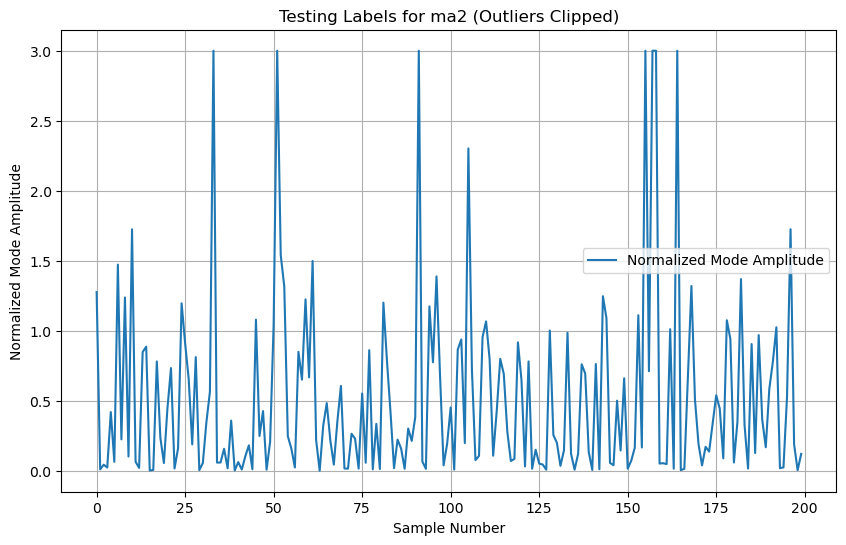

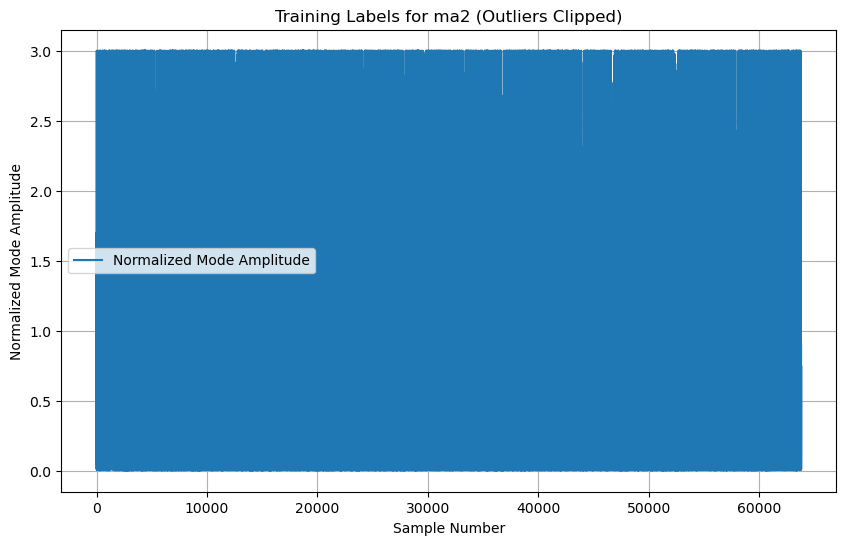

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 25, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 19, 19, 16)     │        50,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 18, 18, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 5184)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       165,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 219,345 (856.82 KB)

 Trainable params: 219,345 (856.82 KB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 7:14 242ms/step - loss: 1.5972

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 3.2797  

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 3.7869

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 3.9972

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 4.0165

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 3.9396

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 3.8336

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 3.7121

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 3.6278

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 3.5430

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 3.4603

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 3.3788

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 3.2999

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 3.2246

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 3.1525

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 3.0833

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 3.0173

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 2.9539

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.8935

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.8359

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.7813

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.7291

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.6794

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.6321

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.5869

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.5438

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.5028

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.4632

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.4254

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 2.3891

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 2.3542

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 2.3208

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 2.2887

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 2.2577

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 2.2278

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 2.1989

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 2.1709

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 2.1440

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 2.1179

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 2.0928

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 2.0684

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 2.0447

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 2.0217

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 1.9994

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 1.9778

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 1.9569

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 1.9365

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 1.9168

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 1.8976

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 1.8791

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.8609

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.8432

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.8259

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.8090

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.7926

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.7767

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.7611

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.7458

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.7309

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.7164

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.7022

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.6883

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.6748

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 1.6616

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 1.6486

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 1.6360

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 1.6235

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 1.6114

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 1.5996

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.5879

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.5822

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.5709

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.5598

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.5489

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.5382

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.5277

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.5174

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 1.5074

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 1.5024

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 1.4926

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 1.4831

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 1.4737

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 1.4644

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.4599

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.4554

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.4465

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.4377

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.4291

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.4207

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.4124

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.4042

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3962

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3883

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3805

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3729

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3655

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3581

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3508

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3437

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3367

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3298

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3230

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 1.3164

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.3098

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.3033

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2969

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2907

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2845

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2814

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2784

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2724

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2665

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 1.2607

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 1.2579

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 1.2522

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 1.2466

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 1.2410

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 1.2356

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2302

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2249

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 1.2198

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.2147

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.2121

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.2096

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.2072

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.2022

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.1974

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.1926

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.1879

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.1832

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.1786

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.1741

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.1696

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 1.1652

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 1.1586

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 1.1522

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 1.1479

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 1.1437

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 1.1375

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 1.1335

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 1.1294

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 1.1235

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 1.1195

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 1.1157

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 1.1099

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 1.1062

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 1.1024

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 1.0988

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 1.0951

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 1.0897

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 1.0862

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 1.0809

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 1.0758

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 1.0707

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 1.0657

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 1.0625

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 1.0592

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 1.0560

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 1.0528

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 1.0497

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 1.0466

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 1.0435

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0405

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0374

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0345

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0315

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0286

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0257

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0228

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0199

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0171

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 1.0143

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 1.0116

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 1.0088

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 1.0061

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 1.0035

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 1.0008

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.9982

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.9956

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.9930

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.9905

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.9867

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.9842

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9817

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9781

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9756

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9732

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9709

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9685

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9662

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9638

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9615

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9593

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.9570

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9548

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9515

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9493

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9471

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9449

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9428

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9407

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9386

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9365

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9344

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9324

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.9303

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9283

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9263

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9234

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9214

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9195

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9175

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9156

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9138

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9119

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9091

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.9072

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.9054

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.9036

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.9018

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.9000

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.8982

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.8956

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.8938

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.8921

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.8904

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.8887

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.8861

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.8836

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.8819

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.8803

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.8787

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8770

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8754

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8738

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8722

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8706

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8691

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8675

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8652

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8636

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.8621

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8606

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8591

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8576

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8561

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8546

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8531

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8517

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8502

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8488

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8473

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8459

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8445

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8431

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8417

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8396

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8383

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.8369

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8356

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8342

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8329

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8316

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8302

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8289

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8276

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8264

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8251

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8238

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8225

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8213

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8200

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8188

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8176

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8163

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8151

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.8139

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8127

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8115

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8103

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8092

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8080

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8062

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8045

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8034

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8017

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.8006

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.7995

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.7978

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7967

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7956

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7945

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7935

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7919

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7908

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7892

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7882

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7871

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7861

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7851

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7840

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.7830

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7815

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7805

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7795

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7785

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7770

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7761

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7751

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7737

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7727

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7718

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7708

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.7699

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7685

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7671

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7662

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7653

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7639

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7630

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7616

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7608

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7599

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7590

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7581

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7572

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.7564

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7555

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7547

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7538

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7525

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7517

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7508

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7500

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7488

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7479

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7471

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7463

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7451

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.7443

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7430

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7422

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7415

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7403

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7395

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7387

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7376

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7364

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7357

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7345

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7338

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.7330

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.7319

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.7312

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.7305

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.7297

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.7290

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.7283

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.7272

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.7265

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.7254

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.7243

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.7236

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.7229

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.7222

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7212

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7205

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7194

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7187

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7180

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7174

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7170

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7160

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7153

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7147

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7140

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7133

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7127

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7117

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7107

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.7100

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7091

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7084

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7075

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7068

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7062

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7056

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7046

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7040

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7031

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7024

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7018

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.7009

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.7000

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6991

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6981

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6975

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6969

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6960

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6954

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6945

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6940

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6934

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6928

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6922

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6913

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.6908

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6899

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6893

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6885

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6879

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6871

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6865

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6860

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6854

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6849

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6843

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6838

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6832

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6827

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6821

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.6816

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6811

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6805

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6800

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6795

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6789

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6784

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6779

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6771

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6766

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6758

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6753

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6748

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6743

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6738

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6733

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.6728

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6723

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6718

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6713

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6708

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6703

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6698

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6694

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6686

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6679

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6674

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6669

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6665

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6660

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6655

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.6648

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6644

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6637

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6632

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6627

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6620

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6616

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6609

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6604

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6600

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6595

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6589

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6584

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6580

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6575

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.6571

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6564

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6558

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6551

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6547

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6540

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6536

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6532

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6525

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6521

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6517

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6510

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6506

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.6502

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6498

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6494

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6489

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6485

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6481

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6477

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6473

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6469

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6465

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6459

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6454

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6450

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6446

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6442

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6438

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6434

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6430

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.6426

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6422

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6419

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6415

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6411

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6407

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6403

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6399

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6395

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6391

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6388

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6384

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6380

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6376

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6372

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6369

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6365

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6361

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6357

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.6354

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6350

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6346

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6343

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6339

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6335

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6332

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6328

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6324

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6321

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6317

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6312

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6310

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6306

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6303

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6299

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6296

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6292

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6289

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6285

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.6282

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6278

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6275

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6271

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6268

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6264

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6261

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6257

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6254

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6251

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6247

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6244

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6239

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6235

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6232

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6229

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6225

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.6222

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6219

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6216

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6211

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6207

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6202

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6199

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6194

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6191

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6188

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6185

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6181

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6177

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6172

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6169

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.6166

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6162

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6158

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6153

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6150

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6147

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6144

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6141

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6138

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6135

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6132

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6129

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6126

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6123

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6120

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6117

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.6114

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6111

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6108

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6103

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6100

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6096

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6091

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6087

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6084

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6081

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6078

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6074

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6071

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6068

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6065

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.6063

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6060

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6057

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6054

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6051

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6047

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6043

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6040

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6037

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6033

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6030

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6026

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6023

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6019

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6016

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.6014

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.6011

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.6008

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.6006

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.6003

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.6000

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5998

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5995

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5992

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5990

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5987

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5984

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5982

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5979

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5976

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5974

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5971

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5969

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5966

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.5963

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5961

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5958

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5956

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5953

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5949

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5947

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5944

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5942

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5939

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5937

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5934

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5932

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5929

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5927

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5924

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.5920

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5917

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5913

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5910

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5908

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5904

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5901

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5898

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5896

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5892

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5890

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5886

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5884

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5881

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.5878

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5874 

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5872

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5869

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5866

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5862

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5859

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5855

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5853

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5851

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5847

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5845

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5843

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5840

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5838

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.5836

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5834

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5831

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5829

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5827

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5824

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5821

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5819

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5817

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5814

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5812

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5810

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5808

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5806

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5803

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5801

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5798

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.5796

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5793

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5791

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5789

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5787

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5785

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5783

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5780

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5778

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5776

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5774

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5772

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5769

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5767

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5763

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5761

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5759

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.5757

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5755

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5753

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5751

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5749

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5747

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5745

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5743

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5741

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5738

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5735

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5733

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5731

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5729

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5727

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5725

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5723

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5721

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.5719

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5717

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5715

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5713

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5710

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5708

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5706

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5704

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5702

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5700

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5698

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5696

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5695

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5693

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5691

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5689

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5687

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.5685

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5683

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5681

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5679

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5677

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5675

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5672

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5670

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5668

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5666

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5663

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5660

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5658

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5656

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5655

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5653

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.5651

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5649

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5647

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5645

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5644

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5642

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5640

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5638

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5636

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5634

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5633

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5631

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5628

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5626

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5624

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5622

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5620

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5618

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.5617

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5615

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5613

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5611

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5609

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5608

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5606

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5604

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5603

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5601

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5599

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5597

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5596

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5594

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5592

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5591

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5589

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5587

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.5585

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5584

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5582

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5580

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5579

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5577

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5575

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5574

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5572

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5570

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5569

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5567

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5565

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5562

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5560

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5558

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.5556

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5555

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5553

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5551

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5549

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5547

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5546

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5544

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5543

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5541

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5539

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5538

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5536

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5535

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5533

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5532

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5530

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5528

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.5525 - val_loss: 0.3842


Epoch 2/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.2306

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4080 

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.4203

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.4207

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4189

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4181

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.4157

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4170

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4179

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4181

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4184

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4187

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4183

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4178

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4176

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4182

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4183

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4182

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4182

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4177

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4171

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4165

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4161

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4156

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4147

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4141

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4134

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4125

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4117

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4108

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4099

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4091

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4086

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4079

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4074

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4067

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4062

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4057

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4051

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4046

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4041

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4038

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4035

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4031

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4028

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4023

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4020

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4015

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4012

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4008

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4004

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4000

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3996

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3993

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3990

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3985

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3982

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3978

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3973

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3968

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3963

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3959

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3954

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3951

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3947

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3943

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3940

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3937

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3934

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3932

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3930

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3928

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3926

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3925

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3923

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3921

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3920

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3919

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3917

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3915

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3912

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3910

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3908

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3905

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3904

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3902

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3901

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3900

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3899

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3898

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3897

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3897

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3896

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3895

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3894

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3893

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3892

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3891

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3890

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3889

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3888

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3887

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3887

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3887

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3887

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3887

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3887

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3887

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3887

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3887

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3887

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3888

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3887

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3887

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3887

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3887

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3887

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3886

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3886

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3886

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3886

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3887

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3887

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3887

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3887

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3887

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3887

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3887

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3883

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3883

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3883

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3882

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3882

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3882

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3882

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3881

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3881

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3881

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3881

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3881

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3880

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3880

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3880

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3880

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3880

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3879

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3879

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3879

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3879

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3879

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3878

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3878

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3878

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3878

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3878

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3877

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3877

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3877

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3877

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3877

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3877

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3876

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3876

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3876

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3876

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3876

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3875

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3875

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3875

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3875

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3874

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3874

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3874

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3874

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3873

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3873

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3873

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3873

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3872

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3872

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3872

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3872

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3872

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3872

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3871

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3871

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3871

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3871

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3871

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3871

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3870

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3870

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3870

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3870

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3870

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3870

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3870

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3869

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3868

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3868

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3868

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3868

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3868

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3868

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3868

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3868

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3867

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3866

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3866

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3866

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3866

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3866

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3866

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3866

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3865

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3865

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3865

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3865

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3865

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3865

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3865

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3865

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3864

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3864

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3864

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3864

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3864

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3864

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3864

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3864

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3863

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3863

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3863

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3863

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3863

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3863

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3863

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3862

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3862

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3862

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3862

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3862

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3862

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3862

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3861

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3861

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3861

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3861

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3861

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3861

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3861

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3860

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3860

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3860

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3860

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3860

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3860

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3860

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3860

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3860

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3860

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3860

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3860

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3859

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3859

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3859

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3859

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3859

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3859

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3859

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3858

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3858

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3858

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3858

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3858

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3858

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3858

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3858

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3857

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3857

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3857

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3857

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3857

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3857

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3857

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3857

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3856

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3856

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3856

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3856

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3856

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3855

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3855

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3855

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3855

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3855

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3854

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3854

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3854

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3854

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3854

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3854

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3854

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3853

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3853

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3853

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3853

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3853

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3853

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3853

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3852

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3852

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3852

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3852

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3852

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3851

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3851

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3851

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3851

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3850

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3850

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3850

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3850

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3850

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3849

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3849

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3849

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3849

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3849

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3848

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3848

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3848

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3848

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3848

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3848

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3847

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3847

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3847

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3847

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3847

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3847

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3847

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3846

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3846

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3846

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3846

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3846

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3846

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3846

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3845

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3845

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3845

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3845

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3845

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3845

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3845

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3844

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3844

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3844

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3844

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3844

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3844

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3844

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3844

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3844

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3843

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3843

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3843

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3843

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3843

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3843

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3843

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3843

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3843

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3842

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3841

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3841

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3840

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3840

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3839

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3839

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3839

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3839

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3839

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3839

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3839

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3838

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838 

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3838

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3837

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3837

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3837

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3837

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3837

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3837

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3836

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3836

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3836

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3836

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3835

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3835

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3835

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3835

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3835

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3835

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.3835 - val_loss: 0.3843


Epoch 3/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.3096

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.2961

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.3134

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3292

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3370

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3404

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3431

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3428

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3425

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3412

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3414

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3428

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3439

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3448

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3456

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3453

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3446

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3435

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3426

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3417

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3415

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3418

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3422

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3426

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3431

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3437

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3442

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3449

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3455

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3461

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3466

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3471

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3477

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3482

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3489

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3495

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3502

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3507

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3512

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3517

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3522

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3526

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3530

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3534

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3539

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3544

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3549

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3554

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3558

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3563

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3568

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3572

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3576

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3580

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3584

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3587

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3590

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3593

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3595

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3598

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3600

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3602

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3604

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3606

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3607

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3609

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3610

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3611

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3612

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3613

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3614

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3615

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3616

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3616

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3617

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3618

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3619

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3620

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3621

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3621

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3622

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3623

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3623

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3624

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3625

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3626

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3627

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3628

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3629

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3631

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3631

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3632

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3633

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3633

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3634

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3635

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3635

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3636

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3637

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3638

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3638

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3639

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3640

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3640

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3641

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3642

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3642

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3643

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3644

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3645

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3646

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3646

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3647

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3648

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3649

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3649

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3650

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3650

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3651

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3652

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3652

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3653

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3653

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3653

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3654

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3654

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3654

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3655

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3655

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3655

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3656

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3656

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3656

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3657

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3657

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3657

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3657

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3658

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3658

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3659

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3659

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3659

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3660

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3660

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3661

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3661

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3662

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3662

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3663

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3663

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3664

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3664

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3665

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3665

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3665

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3666

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3666

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3667

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3667

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3668

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3668

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3669

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3669

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3670

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3670

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3671

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3671

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3672

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3672

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3673

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3673

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3674

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3674

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3675

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3675

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3675

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3676

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3676

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3677

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3677

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3677

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3678

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3678

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3678

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3679

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3679

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3680

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3680

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3680

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3681

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3681

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3682

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3682

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3682

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3683

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3683

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3683

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3684

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3684

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3685

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3685

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3686

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3686

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3687

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3687

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3688

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3688

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3688

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3689

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3689

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3690

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3690

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3691

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3691

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3692

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3693

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3693

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3694

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3694

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3695

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3695

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3696

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3696

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3697

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3697

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3698

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3698

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3699

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3699

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3700

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3700

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3701

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3701

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3702

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3702

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3703

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3703

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3704

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3704

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3705

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3705

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3706

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3706

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3707

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3707

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3707

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3708

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3708

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3708

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3709

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3709

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3709

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3710

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3710

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3711

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3711

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3711

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3712

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3713

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3713

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3714

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3714

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3715

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3715

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3716

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3717

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3717

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3718

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3718

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3719

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3719

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3720

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3720

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3721

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3721

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3722

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3722

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3722

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3723

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3723

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3724

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3724

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3725

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3725

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3725

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3726

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3726

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3726

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3727

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3727

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3727

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3728

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3728

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3728

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3729

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3729

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3729

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3730

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3730

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3730

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3730

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3731

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3731

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3731

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3731

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3732

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3732

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3732

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3733

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3733

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3733

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3733

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3734

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3734

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3734

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3735

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3735

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3735

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3735

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3735

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3736

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3736

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3736

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3736

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3736

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3736

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3737

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3737

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3737

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3737

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3737

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3737

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3738

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3738

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3738

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3738

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3738

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3738

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3739

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3739

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3739

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3739

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3739

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3740

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3740

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3740

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3740

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3740

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3741

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3741

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3742

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3742

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3742

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3742

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3742

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3742

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3743

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3743

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3743

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3743

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3743

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3743

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3743

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3744

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3745

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3745

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3745

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3745

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3745

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3745

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3746

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3746

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3746

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3746

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3746

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3746

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3747

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3747

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3747

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3747

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3747

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3747

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3748

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3748

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3748

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3748

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3748

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3748

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3749

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3749

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3749

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3749

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3749

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3749

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3749

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3750

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3750

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3750

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3750

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3750

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3750

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3751

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3751

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3751

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3751

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3751

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3751

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3752

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3752

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3752

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3752

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3752

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3752

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3752

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3753

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3753

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3753

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3753

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3753

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3753

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3753

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3754

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3754

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3754

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3754

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3754

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3754

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3754

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3754

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3754

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3754

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3755

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3755

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3755

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3755

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3755

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3755

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3755

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3755

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3755

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3755

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3755

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3756

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3756

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3756

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3756

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3756

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3756

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3756

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3756

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3756

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3756

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3756

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3756

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3757

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3757

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3757

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3757

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3757

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3757

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3757

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3757

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3757

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3757

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3757

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3757

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3758

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3758

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3758

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3758

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3758

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3758

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3758

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3758

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3758

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3759

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3759

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3759 

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3759

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3759

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3759

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3759

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3759

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3760

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3760

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3760

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3760

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3760

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3760

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3760

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3760

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3761

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3761

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3761

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3761

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3761

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3761

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3761

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3761

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3761

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3761

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3762

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3762

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3762

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3762

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3762

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3762

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3762

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3763

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3763

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3763

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3763

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3763

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3763

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3763

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3764

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3764

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3764

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3764

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3764

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3764

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3764

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3765

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3765

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3765

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3765

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3765

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3765

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3765

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3765

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3765

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3766

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3766

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3766

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3766

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3766

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3766

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3766

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3766

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3766

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3767

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3767

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3767

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3767

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3767

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3767

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3767

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3767

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3768

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3768

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3768

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3768

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3768

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3768

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3768

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3768

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3769

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3769

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3769

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3769

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3769

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3769

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3769

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3769

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3769

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3769

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3770

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3770

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3770

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3770

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3770

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3770

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3770

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3770

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3770

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3771

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3771

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3771

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3771

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3771

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3771

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3771

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3771

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3771

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3772

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3772

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3772

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3772

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3773

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3774

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3775

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3775

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3775 - val_loss: 0.3846


Epoch 4/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2564

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3840

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3780

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3772

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3763

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3755

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3813

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3864

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3934

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3987

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4034

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4076

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4104

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4121

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4129

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4131

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4134

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4138

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4142

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4140

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4135

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4129

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4124

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4120

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4116

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4112

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4108

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4102

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4099

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4095

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4092

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4088

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4085

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4082

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4078

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4074

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4070

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4065

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4058

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4053

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4049

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4044

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4039

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4035

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4032

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4030

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4027

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4024

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4021

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4017

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4014

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4011

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4009

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4005

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4003

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4001

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3998

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3995

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3993

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3990

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3988

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3985

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3982

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3980

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3977

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3975

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3973

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3971

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3970

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3969

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3967

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3965

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3963

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3960

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3958

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3955

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3953

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3950

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3947

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3945

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3942

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3941

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3939

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3938

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3937

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3935

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3934

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3932

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3931

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3929

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3928

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3928

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3927

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3927

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3926

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3926

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3925

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3924

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3923

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3923

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3922

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3922

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3921

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3921

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3920

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3919

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3918

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3917

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3916

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3915

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3914

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3914

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3913

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3912

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3911

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3911

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3910

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3909

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3909

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3908

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3907

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3906

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3905

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3904

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3903

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3903

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3902

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3902

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3902

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3901

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3901

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3900

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3900

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3899

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3899

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3898

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3898

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3897

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3896

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3896

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3895

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3894

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3894

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3893

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3893

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3892

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3892

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3891

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3891

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3890

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3889

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3889

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3888

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3888

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3887

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3887

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3887

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3886

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3885

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3884

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3883

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3883

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3882

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3882

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3882

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3882

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3883

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3883

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3883

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3883

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3883

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3883

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3883

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3883

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3883

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3883

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3884

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3884

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3884

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3884

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3883

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3883

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3883

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3883

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3883

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3883

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3883

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3883

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3883

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3883

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3883

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3883

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3883

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3884

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3884

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3884

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3884

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3884

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3884

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3885

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3885

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3885

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3885

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3885

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3885

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3885

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3885

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3885

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3884

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3883

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3883

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3883

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3883

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3883

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3883

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3883

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3883

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3882

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3882

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3882

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3882

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3882

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3882

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3881

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3881

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3881

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3881

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3881

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3881

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3881

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3881

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3880

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3880

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3880

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3880

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3880

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3880

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3879

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3879

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3879

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3879

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3879

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3879

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3879

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3879

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3878

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3878

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3877

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3877

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3877

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3877

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3877

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3876

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3875

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3875

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3875

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3875

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3875

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3875

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3875

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3875

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3875

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3875

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3875

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3875

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3875

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3874

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3874

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3874

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3874

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3874

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3874

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3874

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3874

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3874

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3874

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3874

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3873

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3873

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3873

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3873

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3873

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3873

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3873

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3873

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3873

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3873

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3873

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3873

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3872

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3871

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3871

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3871

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3871

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3871

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3871

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3871

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3871

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3871

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3870

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3870

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3870

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3870

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3870

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3870

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3870

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3870

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3870

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3870

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3870

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3870

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3870

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3869

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3868

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3868

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3868

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3868

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3868

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3868

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3868

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3868

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3868

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3868

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3868

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3867

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3867

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3867

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3867

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3867

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3867

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3867

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3867

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3867

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3867

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3867

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3867

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3866

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3866

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3866

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3866

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3866

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3866

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3866

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3866

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3866

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3866

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3865

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3865

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3865

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3865

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3865

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3865

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3865

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3865

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3864

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3864

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3864

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3864

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3864

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3864

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3864

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3864

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3864

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3863

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3863

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3863

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3863

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3863

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3863

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3863 

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3863

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3863

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3863

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3863

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3863

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3863

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3862

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3862

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3862

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3862

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3862

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3862

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3862

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3862

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3862

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3862

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3862

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3862

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3862

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3861

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3861

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3861

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3861

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3861

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3861

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3861

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3861

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3861

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3861

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3861

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3861

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3861

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3860

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3860

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3860

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3860

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3860

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3860

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3860

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3860

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3860

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3860

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3860

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3860

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3860

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3860

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3859

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3859

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3859

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3859

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3859

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3859

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3859

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3858

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3858

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3858

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3858

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3858

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3858

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3858

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3858

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3858

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3857

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3857

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3857

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3857

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3857

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3857

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3857

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3857

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3857

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3857

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3857

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3857

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3857

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3857

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3856

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3856

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3856

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3856

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3856

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3856

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3856

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3856

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3856

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3855

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.3855 - val_loss: 0.3884


Epoch 5/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2927

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.2719

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2625

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.2706

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.2784

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2833

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2900

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.2958

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3014

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3062

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3114

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3154

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3201

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3236

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3262

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3285

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3301

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3316

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3329

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3346

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3357

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3372

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3379

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3386

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3393

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3399

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3408

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3419

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3432

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3445

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3460

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3475

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3489

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3502

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3515

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3528

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3538

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3548

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3558

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3566

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3575

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3584

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3592

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3600

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3606

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3611

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3616

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3620

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3624

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3627

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3630

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3633

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3637

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3640

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3643

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3645

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3648

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3650

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3652

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3654

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3656

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3658

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3660

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3661

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3662

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3663

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3664

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3666

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3667

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3669

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3670

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3672

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3673

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3674

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3675

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3676

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3676

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3678

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3679

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3680

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3681

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3682

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3683

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3684

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3685

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3686

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3686

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3687

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3688

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3689

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3689

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3690

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3691

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3692

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3692

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3693

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3694

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3694

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3695

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3696

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3696

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3697

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3698

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3699

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3699

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3700

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3700

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3701

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3701

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3701

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3702

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3702

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3702

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3703

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3703

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3704

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3704

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3705

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3705

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3706

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3706

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3707

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3708

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3708

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3709

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3709

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3710

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3711

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3712

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3713

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3713

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3714

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3715

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3715

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3716

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3716

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3717

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3717

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3717

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3718

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3718

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3718

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3718

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3718

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3719

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3719

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3719

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3720

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3720

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3720

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3720

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3721

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3721

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3721

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3721

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3721

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3722

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3722

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3722

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3722

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3722

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3722

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3723

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3723

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3723

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3723

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3724

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3724

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3724

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3724

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3724

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3724

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3725

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3725

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3725

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3725

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3725

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3726

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3726

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3726

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3726

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3727

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3727

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3727

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3727

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3728

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3728

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3728

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3728

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3728

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3729

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3729

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3729

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3729

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3729

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3729

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3730

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3730

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3730

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3730

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3731

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3731

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3731

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3731

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3731

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3732

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3732

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3732

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3732

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3732

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3732

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3733

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3733

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3733

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3733

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3733

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3734

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3734

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3734

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3734

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3734

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3735

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3735

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3735

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3735

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3736

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3736

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3736

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3736

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3736

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3737

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3737

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3737

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3737

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3737

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3738

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3738

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3738

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3738

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3739

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3739

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3739

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3739

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3739

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3740

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3740

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3740

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3740

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3740

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3740

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3741

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3741

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3741

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3741

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3741

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3741

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3742

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3742

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3742

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3742

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3742

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3743

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3743

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3743

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3743

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3743

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3744

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3744

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3744

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3744

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3745

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3745

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3745

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3745

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3746

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3746

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3746

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3746

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3747

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3747

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3747

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3747

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3747

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3748

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3748

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3748

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3748

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3749

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3749

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3749

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3749

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3749

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3750

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3750

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3750

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3750

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3750

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3751

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3751

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3751

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3751

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3751

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3751

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3752

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3752

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3752

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3752

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3752

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3752

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3753

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3753

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3753

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3753

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3753

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3754

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3754

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3754

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3754

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3754

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3754

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3755

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3755

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3755

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3755

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3755

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3755

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3755

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3755

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3756

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3756

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3756

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3756

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3756

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3756

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3756

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3756

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3756

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3756

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3757

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3757

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3757

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3757

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3757

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3757

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3757

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3758

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3758

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3758

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3758

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3758

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3758

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3759

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3759

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3759

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3759

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3759

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3760

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3760

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3760

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3760

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3760

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3761

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3761

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3761

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3761

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3762

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3762

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3762

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3762

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3763

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3763

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3763

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3763

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3764

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3764

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3764

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3764

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3765

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3765

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3765

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3765

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3766

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3766

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3766

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3766

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3766

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3767

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3767

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3767

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3767

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3768

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3768

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3768

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3768

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3769

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3769

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3769

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3769

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3770

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3770

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3770

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3770

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3770

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3771

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3771

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3771

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3771

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3771

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3772

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3772

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3772

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3772

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3772

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3773

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3773

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3773

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3773

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3773

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3774

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3774

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3774

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3774

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3774

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3774

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3774

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3775

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3775

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3775

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3775

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3775

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3775

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3776

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3776

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3776

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3776

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3776

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3776

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3776

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3777

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3777

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3777

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3777

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3777

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3777

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3777

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3778

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3778

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3778

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3778

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3778

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3779

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3779

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3779

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3779

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3779

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3780

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3780

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3780

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3780

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3780

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3780

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3781

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3781

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3781

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3781

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3781

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3782

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3782

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3782

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3782

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3782

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3784 

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3784

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3784

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3786

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3786

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3786

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3786

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3786

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3788

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3788

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3788

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3788

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3788

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3789

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3789

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3789

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3789

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3789

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3789

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3789

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3789

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3789

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3790

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3790

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3791

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3791

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3791

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3791

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3791

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3791

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3791

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3791

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3791

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3791

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3793

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3794

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3794

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3794

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3794

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3794

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3794

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3794

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3794

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3794

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3794

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3796

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3796

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3796 - val_loss: 0.3844


Epoch 6/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 32ms/step - loss: 0.5188

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4277

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.4207

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4166

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4122

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4092

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4113

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.4172

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4214

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4254

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4282

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4298

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4301

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4297

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.4288

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4283

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4282

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4280

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4276

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4276

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4277

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4278

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4277

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4275

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4272

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4269

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4267

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4264

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4261

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4258

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4253

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4248

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4242

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4237

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4233

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4228

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4222

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4217

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4212

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4206

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4202

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4199

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4195

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4192

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4187

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4182

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4177

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4172

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4166

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4160

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4155

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4150

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4145

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4140

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4135

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4130

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4126

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4121

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4116

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4112

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4108

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4103

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4098

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4093

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4089

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4084

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4080

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4075

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4071

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4068

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4065

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4061

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4058

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4054

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4050

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4046

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4042

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4038

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4034

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4030

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4027

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4023

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4020

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4018

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4014

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4012

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4010

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4009

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4007

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4005

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4004

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4002

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4000

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3999

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3997

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3995

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3994

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3992

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3990

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3988

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3987

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3985

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3984

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3982

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3981

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3978

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3977

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3975

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3974

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3972

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3970

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3969

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3967

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3966

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3965

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3964

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3963

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3962

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3961

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3960

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3959

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3958

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3957

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3956

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3955

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3954

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3954

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3953

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3952

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3951

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3950

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3950

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3949

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3948

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3947

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3946

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3945

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3945

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3944

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3944

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3943

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3942

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3942

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3942

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3941

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3941

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3941

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3940

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3940

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3939

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3939

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3939

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3938

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3938

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3938

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3937

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3937

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3936

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3936

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3936

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3936

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3935

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3935

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3935

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3934

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3934

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3934

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3934

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3933

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3933

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3933

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3933

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3933

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3933

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3932

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3932

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3932

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3932

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3931

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3931

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3931

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3931

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3931

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3931

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3930

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3930

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3930

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3930

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3929

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3929

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3929

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3929

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3928

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3928

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3928

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3928

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3928

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3928

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3927

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3927

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3927

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3927

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3927

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3927

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3926

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3926

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3926

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3926

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3926

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3926

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3926

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3926

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3926

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3926

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3926

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3926

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3926

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3926

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3925

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3925

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3925

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3925

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3925

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3925

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3925

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3925

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3925

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3924

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3924

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3924

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3924

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3923

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3923

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3923

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3923

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3923

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3923

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3923

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3922

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3922

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3922

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3922

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3922

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3922

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3922

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3922

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3922

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3922

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3922

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3922

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3922

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3922

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3922

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3922

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3921

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3921

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3921

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3921

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3921

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3921

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3921

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3921

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3921

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3921

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3920

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3920

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3920

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3920

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3920

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3920

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3920

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3920

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3920

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3920

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3919

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3919

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3919

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3919

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3919

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3919

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3919

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3918

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3918

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3918

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3918

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3918

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3918

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3917

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3916

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3916

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3916

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3916

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3916

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3916

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3916

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3916

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3916

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3916

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3915

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3915

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3915

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3915

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3915

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3915

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3915

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3915

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3914

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3914

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3914

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3914

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3914

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3914

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3914

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3913

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3913

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3913

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3913

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3913

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3913

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3913

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3912

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3912

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3912

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3912

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3912

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3912

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3911

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3911

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3911

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3911

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3911

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3911

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3910

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3910

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3910

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3910

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3910

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3910

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3909

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3909

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3909

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3909

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3909

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3909

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3909

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3909

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3908

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3908

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3908

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3908

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3908

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3908

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3908

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3907

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3907

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3907

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3907

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3907

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3907

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3907

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3906

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3906

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3906

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3906

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3906

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3906

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3906

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3906

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3905

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3905

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3905

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3905

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3905

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3905

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3905

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3905

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3905

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3904

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3904

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3904

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3904

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3904

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3904

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3904

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3903

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3903

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3903

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3903

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3903

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3903

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3903

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3902

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3902

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3902

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3902

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3902

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3902

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3902

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3901

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3901

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3901

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3901

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3901

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3901

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3901

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3900

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3899

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3899

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3899

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3899

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3899

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3899

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3899

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3899

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3899

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3898

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3898

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3898

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3898

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3898

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3898

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3898

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3898 

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3897

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3897

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3897

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3897

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3897

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3897

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3897

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3897

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3896

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3896

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3896

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3896

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3896

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3896

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3896

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3896

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3895

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3895

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3895

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3895

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3895

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3895

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3895

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3895

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3894

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3894

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3894

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3894

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3894

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3894

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3894

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3894

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3893

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3892

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3892

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3892

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3892

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3892

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3892

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3892

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3892

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3891

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3891

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3891

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3891

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3891

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3891

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3891

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3891

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3891

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3890

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3890

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3890

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3890

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3890

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3890

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3890

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3890

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3890

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3889

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3889

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3889

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3889

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3889

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3889

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3889

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3889

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3888

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3888

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3888

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3888

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3888

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3888

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3888

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3888

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3887

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3887

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3887

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3887

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3887

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3887

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3887

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3887

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3887

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3886

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3886

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3886

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3886

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3886

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3886

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3886

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3886

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3886

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3885

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3885

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3885

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3885

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3885

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3885

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3885

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3885

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3885

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3884

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3884

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3884

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3884

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3884

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3884

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3884

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3884

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3884

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3883

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3883

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3883

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3883

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3883

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3883

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3883

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3883

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3883

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3882

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3881

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3881

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3881

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.3881 - val_loss: 0.3844


Epoch 7/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3753

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3389

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3480

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3472

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3451

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3472

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3530

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3569

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3609

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3621

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3613

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3595

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3580

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3565

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3557

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3553

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3551

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3551

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3550

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3552

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3559

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3568

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3576

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3585

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3598

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3610

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3621

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3632

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3642

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3651

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3659

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3665

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3671

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3678

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3683

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3687

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3690

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3692

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3695

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3697

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3699

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3702

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3706

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3709

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3712

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3715

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3718

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3721

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3724

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3727

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3730

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3733

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3737

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3740

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3743

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3746

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3748

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3750

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3751

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3752

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3754

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3756

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3758

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3759

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3760

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3762

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3763

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3764

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3765

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3767

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3767

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3768

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3769

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3770

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3770

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3771

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3771

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3772

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3772

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3773

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3773

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3773

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3774

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3774

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3775

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3775

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3775

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3776

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3777

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3777

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3777

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3778

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3778

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3779

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3779

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3780

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3781

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3781

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3782

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3782

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3782

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3782

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3782

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3782

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3783

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3783

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3783

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3783

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3783

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3784

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3784

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3784

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3785

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3785

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3785

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3786

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3786

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3787

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3787

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3787

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3788

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3788

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3789

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3789

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3790

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3791

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3791

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3792

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3793

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3794

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3794

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3795

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3795

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3796

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3797

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3798

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3798

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3799

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3799

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3800

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3801

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3801

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3801

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3802

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3802

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3803

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3803

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3804

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3805

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3805

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3806

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3806

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3806

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3807

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3807

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3808

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3808

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3809

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3809

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3809

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3809

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3810

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3810

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3810

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3811

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3811

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3811

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3812

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3812

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3812

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3813

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3813

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3813

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3814

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3814

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3815

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3815

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3815

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3816

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3816

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3816

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3817

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3817

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3817

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3818

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3818

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3818

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3818

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3819

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3819

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3819

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3819

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3819

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3819

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3820

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3820

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3820

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3820

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3820

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3821

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3821

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3821

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3821

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3821

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3822

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3822

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3822

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3823

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3823

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3823

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3824

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3824

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3824

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3824

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3824

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3825

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3825

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3825

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3825

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3825

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3826

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3826

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3826

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3826

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3826

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3826

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3827

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3827

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3827

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3827

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3827

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3827

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3828

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3828

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3828

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3828

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3828

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3828

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3828

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3828

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3828

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3828

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3829

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3829

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3829

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3829

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3829

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3829

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3829

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3830

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3830

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3830

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3830

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3830

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3831

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3831

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3831

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3831

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3831

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3831

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3831

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3833

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3833

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3833

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3833

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3833

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3833

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3834

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3835

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3834

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3834

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3834

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3834

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3834

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3833

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3833

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3832

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3832

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3832

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3832

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3832

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3832 

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3832

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3832

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3832

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3832

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3832

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3832

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3832

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3833

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3833

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3833

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3833

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3833

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3833

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3833

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3833

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3833

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3833

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3833

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3833

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3833

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3833

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3833

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3834

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3834

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3834

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3834

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3834

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3834

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3834

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3834

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3833

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3833

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3833

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3833

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3833

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3832

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.3832 - val_loss: 0.3864


Epoch 8/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4521

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4528

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.4516

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4303

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4104

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3995

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3931

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3885

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3852

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3829

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3818

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3810

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3812

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3819

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3830

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3840

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3851

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3859

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3864

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3873

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3885

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3896

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3909

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3918

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3923

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3927

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3934

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3941

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3948

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3953

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3956

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3958

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3959

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3961

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3963

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3966

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3968

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3970

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3973

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3976

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3978

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3981

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3983

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3986

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3989

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3991

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3993

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3995

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3996

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3997

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3997

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3997

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3997

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3997

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3997

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3996

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3995

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3995

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3994

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3993

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3992

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3991

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3991

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3990

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3989

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3989

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3988

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3988

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3988

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3987

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3987

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3987

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3986

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3986

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3986

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3985

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3985

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3985

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3986

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3985

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3985

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3985

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3984

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3984

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3984

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3983

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3983

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3982

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3982

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3981

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3980

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3980

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3979

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3979

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3978

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3978

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3977

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3977

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3976

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3975

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3974

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3974

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3973

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3972

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3971

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3970

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3969

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3968

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3967

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3965

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3964

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3963

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3962

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3962

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3961

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3960

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3960

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3959

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3959

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3959

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3958

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3958

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3958

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3957

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3957

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3957

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3956

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3956

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3956

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3955

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3955

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3954

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3954

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3954

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3953

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3953

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3952

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3952

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3951

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3951

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3951

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3951

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3950

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3950

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3950

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3950

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3950

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3949

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3949

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3949

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3948

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3948

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3948

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3947

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3947

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3947

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3946

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3946

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3946

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3945

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3945

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3944

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3944

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3944

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3943

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3943

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3943

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3942

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3942

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3942

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3941

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3941

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3941

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3941

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3941

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3941

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3941

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3941

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3941

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3940

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3940

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3940

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3940

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3940

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3939

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3939

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3939

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3939

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3939

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3938

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3938

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3938

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3938

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3938

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3938

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3938

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3938

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3938

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3937

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3937

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3937

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3937

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3937

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3936

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3936

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3936

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3936

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3935

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3935

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3935

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3934

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3934

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3934

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3933

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3933

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3933

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3932

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3932

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3932

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3931

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3931

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3931

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3930

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3930

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3930

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3930

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3929

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3929

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3928

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3928

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3928

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3927

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3927

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3927

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3926

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3926

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3926

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3925

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3924

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3923

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3923

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3923

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3923

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3922

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3922

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3922

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3922

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3922

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3921

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3921

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3921

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3920

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3920

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3920

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3920

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3919

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3919

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3919

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3918

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3918

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3918

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3918

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3917

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3917

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3917

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3917

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3916

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3916

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3916

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3915

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3915

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3915

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3915

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3914

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3914

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3914

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3914

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3914

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3913

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3913

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3913

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3913

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3913

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3912

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3912

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3912

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3912

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3911

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3911

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3911

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3911

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3911

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3910

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3910

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3910

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3910

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3909

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3909

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3909

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3909

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3909

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3908

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3908

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3908

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3908

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3908

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3907

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3907

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3907

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3907

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3907

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3907

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3906

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3906

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3906

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3906

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3906

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3906

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3906

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3905

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3905

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3905

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3905

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3905

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3905

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3905

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3904

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3904

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3903

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3903

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3903

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3903

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3903

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3903

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3902

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3900

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3900

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3898

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3898

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3898

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3898

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3896

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3896

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3896

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3896

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3895

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3895

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3895

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3895

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3895

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3895

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3895

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3895

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3894

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3894

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3893

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3893

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3893

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3893

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3893

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3893

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3893

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3893

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3891

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3891

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3891

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3891

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3891

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3891

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3891

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3890

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3890

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3890

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3890

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3890

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3890

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3890

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3889

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3889

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3889

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3889

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3889

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3889

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3889

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3889

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3889

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3888

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3888

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3888

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3888

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3888

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3888

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3888

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3888

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3887

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3887

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3887

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3887

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3887 

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3887

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3887

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3887

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3887

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3887

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3886

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3886

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3886

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3886

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3886

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3886

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3886

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3886

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3886

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3886

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3885

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3884

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3884

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3884

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3884

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3884

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3884

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3884

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3884

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3884

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3884

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3884

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3883

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3883

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3883

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3883

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3883

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3883

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3883

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3882

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3882

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3882

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3882

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3882

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3881

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3881

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3881

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3881

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3881

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3881

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3880

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3879

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3879

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3879

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3879

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3878

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3878

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3878

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3878

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3878

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3878

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3878

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3878

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3878

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3878

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3878

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3877

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3877

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3877

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3877

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3877

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3877

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3877

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3877

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3877

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3877

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3877

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3876

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3875

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3875

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.3875 - val_loss: 0.3839


Epoch 9/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.3373

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3888

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3736

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3770

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3842

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3888

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3921

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3934

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3926

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3903

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3882

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3868

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3857

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3851

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3850

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3847

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3844

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3841

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3836

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3829

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3825

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3823

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3822

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3820

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3818

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3814

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3809

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3807

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3805

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3804

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3802

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3801

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3800

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3800

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3799

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3799

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3799

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3799

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3799

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3800

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3799

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3800

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3801

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3802

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3803

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3804

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3805

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3805

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3805

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3804

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3803

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3802

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3801

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3801

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3800

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3800

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3800

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3799

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3799

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3800

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3800

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3800

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3800

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3801

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3801

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3802

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3802

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3802

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3802

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3803

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3803

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3803

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3803

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3803

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3802

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3802

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3803

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3803

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3804

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3804

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3805

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3806

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3807

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3808

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3809

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3810

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3810

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3811

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3811

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3812

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3812

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3813

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3813

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3813

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3814

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3814

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3815

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3816

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3816

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3817

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3818

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3818

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3819

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3820

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3821

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3822

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3822

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3823

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3824

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3825

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3826

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3827

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3828

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3829

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3830

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3831

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3833

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3834

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3835

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3836

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3837

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3837

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3838

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3839

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3840

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3841

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3842

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3842

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3843

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3843

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3844

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3844

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3845

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3846

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3846

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3846

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3847

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3847

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3848

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3848

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3849

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3849

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3849

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3849

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3849

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3850

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3850

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3850

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3850

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3851

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3851

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3851

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3851

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3852

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3852

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3853

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3853

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3853

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3854

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3854

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3854

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3854

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3855

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3855

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3855

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3855

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3856

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3856

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3856

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3857

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3857

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3857

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3858

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3858

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3858

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3859

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3859

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3859

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3860

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3860

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3860

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3860

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3863

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3863

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3863

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3864

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3864

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3864

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3864

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3865

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3865

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3865

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3865

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3865

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3866

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3866

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3866

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3866

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3866

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3866

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3866

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3867

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3865

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3864

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3864

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3864

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3864

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3864

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3864

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3864

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3864

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3864

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3864

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3864

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3864

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3863

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3863

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3863

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3863

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3863

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3863

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3863

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3862

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3862

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3862

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3862

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3862

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3862

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3862

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3862

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3862

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3861

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3861

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3861

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3861

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3860

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3860

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3860

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3860

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3860

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3860

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3860

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860 

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3858

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3858

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3857

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3857

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3857

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3857

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3854

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3854

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3853

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3853

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3853

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3853

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3853

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3852

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3852

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3852

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3852

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3852

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3852

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3852

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3851

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3851

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3851

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3851

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3851

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3851

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3851

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3851

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3851

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3851

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3850 - val_loss: 0.3857


Epoch 10/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1811

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3088

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3296

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3390

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3469

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3555

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3624

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3663

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3686

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3695

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3683

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3682

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3687

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3695

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3694

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3695

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3700

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3706

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3707

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3703

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3703

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3703

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3702

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3701

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3699

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3696

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3691

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3686

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3681

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3678

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3674

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3670

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3666

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3662

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3660

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3658

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3656

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3653

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3652

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3651

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3650

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3648

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3647

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3645

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3645

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3645

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3645

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3645

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3645

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3646

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3647

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3648

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3649

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3650

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3651

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3652

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3652

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3653

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3654

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3655

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3656

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3657

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3658

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3659

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3660

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3660

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3662

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3663

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3664

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3666

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3667

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3668

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3669

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3670

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3671

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3672

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3674

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3675

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3676

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3677

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3678

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3679

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3681

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3682

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3684

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3685

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3687

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3688

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3689

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3691

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3692

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3693

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3694

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3695

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3696

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3697

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3698

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3699

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3700

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3700

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3701

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3702

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3703

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3703

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3704

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3705

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3705

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3706

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3707

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3707

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3708

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3709

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3709

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3710

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3710

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3711

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3711

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3712

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3712

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3712

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3713

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3713

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3713

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3714

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3714

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3714

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3715

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3715

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3716

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3716

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3717

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3717

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3718

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3718

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3719

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3719

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3720

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3720

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3721

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3721

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3722

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3722

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3723

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3723

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3724

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3724

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3725

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3726

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3726

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3727

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3727

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3728

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3729

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3729

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3730

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3730

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3731

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3731

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3732

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3732

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3733

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3733

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3733

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3733

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3734

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3734

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3734

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3735

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3735

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3735

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3736

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3736

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3736

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3737

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3737

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3737

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3737

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3737

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3738

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3738

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3738

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3738

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3739

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3739

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3739

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3739

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3739

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3740

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3740

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3740

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3740

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3741

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3741

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3741

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3741

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3742

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3742

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3742

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3743

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3743

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3743

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3743

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3744

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3744

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3744

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3745

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3745

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3745

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3746

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3746

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3746

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3747

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3747

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3747

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3748

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3748

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3748

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3749

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3749

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3749

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3750

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3750

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3750

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3751

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3751

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3751

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3752

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3752

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3752

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3753

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3753

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3753

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3753

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3754

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3754

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3754

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3754

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3755

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3755

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3755

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3755

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3755

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3756

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3756

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3756

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3756

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3756

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3756

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3757

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3757

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3757

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3757

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3757

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3758

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3758

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3758

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3758

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3759

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3759

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3759

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3759

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3760

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3760

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3760

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3760

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3760

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3761

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3761

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3761

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3761

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3762

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3762

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3762

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3763

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3763

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3763

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3764

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3764

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3764

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3764

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3765

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3765

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3765

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3766

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3766

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3766

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3767

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3767

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3767

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3767

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3768

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3768

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3768

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3769

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3769

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3769

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3769

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3770

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3770

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3770

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3771

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3771

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3771

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3771

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3772

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3772

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3772

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3772

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3773

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3773

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3773

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3773

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3774

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3774

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3774

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3774

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3774

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3775

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3775

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3775

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3775

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3776

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3776

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3776

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3776

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3777

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3777

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3777

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3777

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3777

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3777

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3778

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3778

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3778

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3778

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3778

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3779

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3779

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3779

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3779

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3779

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3780

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3780

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3780

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3780

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3780

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3781

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3783

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3783

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3783

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3783

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3783

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3783

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3783

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3784

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3784

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3784

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3784

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3784

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3784

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3784

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3785

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3785

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3785

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3785

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3785

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3785

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3785

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3785

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3786

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3786

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3786

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3786

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3786

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3786

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3786

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3786

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3787

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3787

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3787

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3787

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3787

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3787

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3787

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3787

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3788

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3789

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3789

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3790

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3790

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3790

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3790

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3791

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3791

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3791

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3791 

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3791

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3792

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3792

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3792

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3792

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3792

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3793

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3793

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3793

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3793

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3793

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3793

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3793

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3793

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3793

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3794

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3794

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3794

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3794

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3794

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3794

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.3794 - val_loss: 0.3847


Epoch 11/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3883

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3371

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3567

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3699

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3742

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3775

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3796

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3801

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3780

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3771

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3766

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3761

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3759

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3756

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3756

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3759

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3763

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3770

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3781

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3798

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3814

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3828

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3836

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3839

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3842

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3845

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3846

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3847

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3847

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3846

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3845

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3844

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3844

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3843

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3844

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3845

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3846

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3846

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3846

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3845

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3845

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3846

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3847

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3847

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3848

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3849

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3851

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3851

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3852

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3852

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3852

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3853

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3853

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3854

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3854

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3855

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3855

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3854

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3854

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3854

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3854

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3854

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3854

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3854

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3854

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3854

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3853

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3853

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3853

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3853

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3853

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3853

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3854

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3854

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3854

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3854

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3854

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3854

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3854

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3854

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3854

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3855

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3855

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3855

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3855

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3855

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3855

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3856

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3856

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3856

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3856

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3856

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3856

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3856

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3857

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3857

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3857

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3857

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3858

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3858

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3858

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3858

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3858

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3859

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3859

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3859

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3860

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3860

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3861

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3861

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3861

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3862

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3862

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3863

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3864

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3864

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3865

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3865

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3866

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3866

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3867

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3867

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3868

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3868

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3868

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3869

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3869

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3869

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3869

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3870

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3870

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3870

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3870

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3870

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3870

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3870

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3870

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3870

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3870

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3870

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3871

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3871

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3871

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3871

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3871

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3871

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3871

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3871

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3871

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3871

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3871

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3871

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3871

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3871

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3870

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3870

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3870

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3870

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3870

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3870

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3870

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3869

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3869

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3869

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3869

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3868

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3868

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3868

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3868

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3867

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3867

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3867

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3867

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3866

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3866

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3866

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3865

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3865

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3865

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3865

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3864

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3864

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3864

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3863

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3863

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3863

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3863

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3862

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3862

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3862

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3861

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3861

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3861

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3861

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3860

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3860

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3860

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3860

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3860

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3860

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3859

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3859

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3859

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3858

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3857

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3857

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3857

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3857

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3857

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3857

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3857

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3856

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3856

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3856

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3856

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3856

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3856

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3855

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3855

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3855

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3855

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3855

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3854

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3854

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3854

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3854

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3854

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3854

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3853

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3853

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3853

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3853

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3853

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3852

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3852

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3852

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3852

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3851

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3851

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3851

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3851

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3850

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3850

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3850

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3850

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3849

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3849

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3849

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3848

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3848

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3848

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3848

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3847

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3847

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3847

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3847

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3846

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3846

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3846

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3846

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3845

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3845

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3845

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3845

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3844

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3844

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3844

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3844

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3844

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3843

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3843

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3843

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3843

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3843

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3843

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3841

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3841

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3841

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3841

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3841

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3841

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3841

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3840

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3840

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3840

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3840

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3840

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3839

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3839

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3839

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3838

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3838

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3838

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3838

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3839

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3839

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3839

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3840

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3840

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3840

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3840

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840 

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3840

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3840

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3840

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3840

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3839

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3839

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3839

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3839

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3839

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3839

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3839

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3839

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3838

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3838

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3838

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3838

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3838

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3838

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3838

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3838

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3838

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3838

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3837

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3837

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3837

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3837

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3837

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3837

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3837

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3837

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3837

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.3836 - val_loss: 0.3840


Epoch 12/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1655

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1979

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.2452

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.2716

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2861

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2949

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2996

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3052

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3111

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3177

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3234

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3285

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3333

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3374

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3406

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3431

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3454

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3478

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3500

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3521

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3544

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3566

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3586

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3604

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3619

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3635

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3650

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3663

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3668

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3676

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3685

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3693

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3703

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3714

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3724

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3733

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3741

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3748

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3754

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3761

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3768

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3774

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3780

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3786

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3791

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3795

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3798

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3800

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3802

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3804

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3806

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3808

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3810

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3811

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3813

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3814

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3815

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3816

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3817

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3819

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3821

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3822

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3823

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3823

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3824

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3824

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3824

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3824

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3824

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3824

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3824

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3824

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3823

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3824

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3824

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3824

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3823

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3823

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3823

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3823

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3822

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3822

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3822

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3822

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3822

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3823

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3823

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3823

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3824

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3824

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3824

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3824

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3825

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3825

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3825

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3826

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3827

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3827

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3828

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3828

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3829

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3829

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3830

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3830

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3830

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3830

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3831

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3831

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3831

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3832

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3832

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3833

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3833

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3833

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3834

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3834

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3835

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3835

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3835

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3836

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3836

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3837

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3837

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3838

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3838

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3839

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3840

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3841

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3841

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3842

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3842

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3843

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3843

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3843

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3843

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3843

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3845

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3845

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3845

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3845

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3845

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3846

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3846

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3846

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3846

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3847

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3847

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3847

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3848

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3848

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3848

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3849

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3849

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3850

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3850

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3850

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3851

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3851

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3852

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3852

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3852

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3853

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3853

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3853

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3853

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3854

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3854

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3854

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3854

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3855

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3855

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3855

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3855

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3855

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3856

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3856

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3856

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3856

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3857

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3857

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3857

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3858

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3858

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3859

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3859

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3859

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3861

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3861

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3861

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3862

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3862

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3862

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3863

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3863

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3863

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3863

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3864

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3864

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3864

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3864

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3865

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3865

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3865

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3865

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3865

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3866

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3867

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3867

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3867

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3867

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3867

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3867

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3867

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3867

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3868

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3868

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3868

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3868

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3868

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3868

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3868

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3868

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3868

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3869

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3869

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3869

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3869

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3869

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3869

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3869

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3869

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3868

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3868

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3868

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3868

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3868

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3868

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3868

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3868

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3868

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3868

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3868

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3868

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3868

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3868

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3868

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3867

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3867

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3866

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3866

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3866

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3866

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3866

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3866

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3866

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3866

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3866

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3866

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3865

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3864

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3864

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3864

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3864

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3864

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3864

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3864

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3864

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3863

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3862

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3862

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3862

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3862

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3862

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3862

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3862

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3862

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3862

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3862

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3861

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3861

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3861

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3861

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3861

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3861

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3861

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3861

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3861

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3861

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3861

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3861

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3860

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3860

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3860

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3860

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3860

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3860

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3860

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3860

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3859

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3859

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3859

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3859

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3859

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3859

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3858

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3858

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3858

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3858

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3858

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3858

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3858

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3858

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3857

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3857

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3857

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3857

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3857

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3857

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3857

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3857

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3857

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3856

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3856

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3856

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3856

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3856

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3856

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3856

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3856

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3855

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3855

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3855

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3855

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3855

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3855

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3855

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3854

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3854

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3854

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3854

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3854

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3854

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3853

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3853

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3853

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3853

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3853

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3853

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3852

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3852

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3852

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3852

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3852

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3852

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3852

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3852

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3851

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3850

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3850

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3849

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3849

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3849

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3849

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3848

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3848

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3848

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3848

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3848

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3848

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3848

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3848

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3848

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3848

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3848

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3848

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3848

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3848

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3848

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3848

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3847

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3847

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3847

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3847

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3847

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847 

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3847

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3847

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3847

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3847

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3847

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3846

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3846

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3845

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3845

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3845

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3845

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3845

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3845

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3845

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3845

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3845

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3845

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3844

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3844

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3843

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3843

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3843

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3843

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3843

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3843

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3842

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3842

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3842

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3842

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3842

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3842

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3842

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3841

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3841

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3841

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3841

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3841

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3841

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3841

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3841

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3841

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3841 - val_loss: 0.3842


Epoch 13/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.8356

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.6683

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5873

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5506

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5308

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.5154

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.5004

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4882

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.4799

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.4718

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4615

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4566

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4495

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4429

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4385

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4343

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4306

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4270

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4222

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4181

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4145

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4124

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4106

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4088

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4061

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4035

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4009

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3986

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3963

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3948

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3934

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3922

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3907

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3895

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3886

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3876

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3870

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3865

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3860

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3854

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3846

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3840

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3835

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3829

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3823

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3818

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3813

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3807

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3802

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3797

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3793

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3789

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3784

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3780

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3775

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3771

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3766

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3761

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3757

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3753

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3749

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3746

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3744

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3741

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3740

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3738

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3737

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3735

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3734

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3733

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.3731

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3729

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3728

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3726

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3724

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3722

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3720

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.3719

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3718

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3717

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3717

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3717

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3717

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3717

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3717

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3717

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3717

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3717

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3718

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3717

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3717

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3717

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3717

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3716

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3716

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3715

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3715

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3714

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3714

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3713

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3713

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3712

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3712

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3711

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3710

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3709

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3709

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3708

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3707

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3706

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3705

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3704

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3703

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3702

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3701

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3701

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3700

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3699

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3699

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3698

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3698

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3697

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3697

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3696

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3696

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3695

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3695

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3694

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3694

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3693

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3693

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3693

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3693

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3693

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3693

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3693

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3692

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3692

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3692

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3692

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3692

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3692

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3692

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3692

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3692

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3692

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3692

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3692

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3692

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3693

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3693

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3693

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3693

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3693

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3694

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3694

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3694

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3694

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3694

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3694

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3694

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3695

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3695

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3695

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3695

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3695

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3695

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3695

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3695

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3695

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3695

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3695

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3695

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3695

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3696

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3696

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3696

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3696

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3696

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3697

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3697

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3698

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3698

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3698

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3698

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3698

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3698

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3698

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3699

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3699

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3699

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3699

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3699

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3700

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3700

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3700

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3700

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3700

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3701

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3701

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3701

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3701

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3702

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3702

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3702

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3703

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3703

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3703

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3703

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3704

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3704

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3704

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3704

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3705

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3705

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3705

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3706

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3706

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3706

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3707

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3707

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3707

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3708

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3708

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3708

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3709

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3709

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3710

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3710

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3710

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3710

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3711

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3711

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3711

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3712

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3712

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3712

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3713

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3713

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3713

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3714

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3714

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3714

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3715

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3715

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3715

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3716

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3716

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3716

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3716

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3717

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3717

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3717

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3718

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3718

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3718

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3719

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3719

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3719

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3719

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3719

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3720

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3720

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3720

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3721

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3721

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3721

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3721

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3721

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3722

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3722

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3722

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3722

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3723

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3723

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3723

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3724

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3724

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3724

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3725

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3725

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3725

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3725

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3725

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3726

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3726

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3726

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3726

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3726

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3726

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3727

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3727

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3727

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3727

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3728

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3728

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3728

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3728

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3728

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3729

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3729

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3729

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3729

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3730

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3730

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3730

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3730

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3731

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3731

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3731

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3731

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3732

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3732

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3732

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3733

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3733

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3733

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3734

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3734

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3734

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3734

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3735

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3735

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3735

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3735

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3736

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3736

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3736

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3736

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3736

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3736

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3736

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3737

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3737

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3737

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3737

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3737

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3738

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3738

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3738

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3738

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3738

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3738

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3739

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3739

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3739

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3739

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3739

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3739

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3739

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3740

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3740

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3740

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3740

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3740

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3740

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3741

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3742

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3742

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3742

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3742

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3742

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3742

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3742

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3742

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3743

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3744

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3744

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3745

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3745

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3745

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3745

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3745

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3745

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3745

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3745

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3745

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3745

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3745

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3745

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3745

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3745

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3745

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3746

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3747

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3747

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3747

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3748

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3748

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3748

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3748

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3748

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3748

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3748

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3748

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3748

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3748

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3748

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3748

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3748

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3749

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3749

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3749

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3749

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3749

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3749

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3750

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3750

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3750

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3750

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3751

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3752

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752 

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3752

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3753

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3753

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3753

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3753

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3753

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3753

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3753

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3753

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3753

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3753

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3753

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3754

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3754

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3754

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3754

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3754

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3755

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3755

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3755

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3755

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3756

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3756

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3756

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3757

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3758

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3758

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3759

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3759

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3759

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3759

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3760

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3760

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3760

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3760

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3761

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3761

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3761

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3761

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3762

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3762

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3762

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3762

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3762

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3762

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3763

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3763

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3763

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3763

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3763

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3763

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3763

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3763

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3763 - val_loss: 0.3838


Epoch 14/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.4801

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4709

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.5014

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.4994

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4898

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.4810

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4730

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.4643

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.4565

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4501

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4438

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4380

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4329

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4307

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4292

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4277

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4265

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4254

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4243

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4229

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4212

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4192

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4174

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4159

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4144

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4133

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4122

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4112

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4102

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4092

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4082

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4073

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4064

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4055

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4047

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4041

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4035

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4029

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4025

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4020

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4015

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4011

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4007

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4004

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.4000

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3997

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3995

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3992

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3989

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3986

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3983

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3982

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3981

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3980

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3979

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3978

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3977

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3976

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3975

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3974

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3973

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3972

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3970

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3969

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3969

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3969

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3969

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3969

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3969

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3969

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3968

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3968

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3968

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3968

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3968

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3967

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3967

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3967

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3967

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3967

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3966

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3966

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3966

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3965

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3964

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3964

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3963

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3962

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3961

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3961

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3960

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3959

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3959

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3958

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3957

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3956

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3955

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3954

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3953

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3951

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3950

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3949

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3947

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3945

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3944

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3943

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3942

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3941

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3940

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3940

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3939

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3939

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3938

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3938

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3937

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3937

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3936

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3936

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3936

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3936

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3935

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3935

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3935

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3935

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3934

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3934

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3934

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3933

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3933

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3933

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3933

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3933

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3933

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3933

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3933

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3934

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3934

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3935

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3935

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3936

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3936

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3937

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3938

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3938

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3939

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3939

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3940

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3940

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3940

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3940

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3940

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3940

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3940

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3940

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3940

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3940

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3940

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3940

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3940

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3939

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3939

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3939

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3939

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3938

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3938

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3937

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3937

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3936

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3936

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3936

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3935

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3935

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3935

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3935

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3934

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3934

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3934

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3933

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3933

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3933

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3932

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3932

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3932

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3931

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3931

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3931

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3930

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3930

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3930

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3930

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3929

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3929

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3929

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3929

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3928

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3928

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3928

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3928

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3928

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3928

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3927

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3927

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3927

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3927

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3927

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3927

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3927

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3927

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3927

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3927

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3927

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3927

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3927

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3927

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3927

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3926

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3926

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3926

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3926

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3926

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3925

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3925

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3924

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3924

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3924

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3924

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3924

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3924

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3923

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3922

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3922

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3922

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3922

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3922

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3922

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3922

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3922

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3922

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3921

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3921

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3921

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3921

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3921

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3921

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3921

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3921

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3921

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3920

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3920

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3920

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3920

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.3920

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3920

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3920

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3920

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3920

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3920

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3919

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3919

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3919

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3919

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3919

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3919

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3919

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3919

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3919

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3918

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3918

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3918

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.3918

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3918

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3918

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3918

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3917

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3917

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3917

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3917

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3917

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3917

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3917

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3916

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3916

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.3916

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3916

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3916

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3916

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3916

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3916

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3916

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3916

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3916

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3915

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3915

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3915

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3915

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3915

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3915

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3915

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3915

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3915

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3915

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3914

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3914

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3915

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3915

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3915

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3915

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3915

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3915

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3915

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3915

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3915

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3915

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3914

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.3914

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3914

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3913

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3912

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3912

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3912

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3912

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3912

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3912

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3912

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3912

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3912

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3911

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3910

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3910

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3910

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3910

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3910

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3910

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3910

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3910

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3910

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3909

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3908

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3908

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3908

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3908

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3908

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3908

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3908

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3908

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3908

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3908

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3908

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3907

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3906

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3906

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3906

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3906

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3906

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3906

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3906

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3906

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3906

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3905

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3905

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3905

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3905

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3905

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3905

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3905

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3905

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3904

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3904

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3904

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3904

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3904

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3904

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3904

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3903

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3903

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3903

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3903

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3903

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3903

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3903

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3902

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3902

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3902

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3902

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3902

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3902

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3901

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3901

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3901

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3901

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3901

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3901

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3901

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3900

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3900

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3900

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3900

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3900

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3900

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3900

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3899

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3899

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3899

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3899

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3899

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3899

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3899

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.3899

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3898

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3898

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3898

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3898

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3898

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3898

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3898

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3897

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3897

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3897

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3897

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3897

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3897

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.3897

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3896

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3896

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3896

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3896

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3896

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3896

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3895

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3895

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3895

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3895

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3895

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3895

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3895

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.3894

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3894

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3894

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3894

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3894

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3894

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3894

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3894

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3893

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3893

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3893

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3893

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3893

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3893

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3893

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.3893

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3893

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3892

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3892

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3892

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3892

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3892

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3892

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3892

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3892

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3892

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3891

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3891

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3891

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3891

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3891

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3891

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3891

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.3891

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3891 

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3891

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3891

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3890

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3889

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3889

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3889

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3889

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.3889

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3889

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3889

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3889

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3889

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3889

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3889

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3888

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3888

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3888

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3888

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3888

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3888

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3888

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3888

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3887

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.3887

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3887

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3887

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3887

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3887

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3887

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3887

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3887

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3887

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.3886

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3886

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3886

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3886

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3885

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.3884

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3884

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3883

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3883

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3883

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.3883

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3883

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3882

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3882

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3882

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3882

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3882

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3882

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.3882

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3882

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3882

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3882

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3882

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3882

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3882

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.3881

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3880

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3879

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3879

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3879

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3879

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3879

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.3879

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3879

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3879

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3879

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3879

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3879

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3879

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3879

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3879

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3878

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3878

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3878

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3878

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3877

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3876

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.3876 - val_loss: 0.3839


Epoch 15/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1677

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.2545

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3058

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3260

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3421

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3518

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3641

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3702

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3733

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3774

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3790

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3799

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3805

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3819

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3832

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3839

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3845

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3852

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3861

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3868

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3870

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3871

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3873

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3874

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3873

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3872

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3870

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3867

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3865

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3863

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3863

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3862

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3862

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3862

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3863

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3862

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3861

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3861

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3861

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3861

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3860

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3859

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3857

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3855

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3853

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3851

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3850

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3848

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3847

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3845

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3844

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3842

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3840

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3838

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3836

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3834

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3833

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3831

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3829

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3828

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3826

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3824

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3823

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3821

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3820

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3818

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3816

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3815

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3814

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3813

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3812

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3812

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3811

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3810

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3809

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3808

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3806

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3805

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3804

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3802

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3800

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3799

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3798

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3797

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3795

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3794

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3793

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3791

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3790

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3789

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3788

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3787

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3786

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3785

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3784

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3783

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3782

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3782

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3781

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3781

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3780

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3779

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3779

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3778

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3778

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3777

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3776

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3776

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3775

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3775

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3774

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3774

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3773

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3773

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3772

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3772

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3772

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3771

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3771

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3771

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3770

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3770

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3770

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3770

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3769

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3769

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3768

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3768

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3768

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3768

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3768

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3767

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3767

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3767

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3766

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3766

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3766

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3766

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3766

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3765

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3765

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3765

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3765

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3764

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3764

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3764

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3763

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3763

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3763

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3762

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3762

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3762

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3761

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3761

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3761

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3761

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3760

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3760

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3759

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3759

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3759

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3759

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3759

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3758

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3758

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3758

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3758

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3758

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3758

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3758

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3757

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3757

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3757

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3757

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3756

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3756

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3756

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3756

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3756

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3755

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3755

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3755

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3755

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3754

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3754

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3754

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3754

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3754

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3753

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3753

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3753

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3753

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3753

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3753

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3752

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3752

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3752

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3752

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3752

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3752

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3752

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3752

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3752

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3752

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3752

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3752

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3752

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3752

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3752

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3752

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3752

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3752

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3753

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3753

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3753

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3753

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3753

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3753

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3753

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3754

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3754

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3754

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3754

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3754

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3754

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3754

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3755

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3755

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3755

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3755

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3755

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3756

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3756

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3756

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3757

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3757

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3757

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3757

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3758

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3758

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3758

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3758

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3758

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3759

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3759

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3759

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3759

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3760

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3760

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3760

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3760

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3761

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3761

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3761

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3762

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3762

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3762

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3762

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3763

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3763

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3763

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3763

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3764

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3764

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3764

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3764

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3765

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3765

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3765

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3765

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3766

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3766

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3766

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3766

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3767

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3767

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3767

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3768

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3768

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3768

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3769

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3769

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3769

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3769

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3770

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3770

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3770

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3770

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3771

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3771

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3771

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3771

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3772

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3772

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3772

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3772

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3773

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3773

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3773

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3773

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3774

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3774

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3774

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3774

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3774

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3775

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3775

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3775

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3775

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3775

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3776

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3776

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3776

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3776

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3776

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3777

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3777

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3777

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3777

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3777

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3777

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3778

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3778

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3778

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3778

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3778

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3779

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3779

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3779

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3779

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3779

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3779

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3780

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3780

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3780

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3780

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3780

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3780

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3780

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3781

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3781

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3781

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3781

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3781

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3781

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3781

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3782

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3782

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3782

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3782

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3782

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3782

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3783

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3783

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3783

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3783

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3783

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3783

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3783

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3783

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3783

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3783

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3784

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3784

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3784

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3785

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3785

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3786

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3786

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3787

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3787

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3787

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3787

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3787

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3788

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3788

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3788

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3789

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3789

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3789

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3790

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3790

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3790

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3790

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3790

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3791

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3791

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3791

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3792

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792 

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3792

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3793

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3793

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3793

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3793

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3793

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3793

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3793

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3793

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3793

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3793

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3794

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3794

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3794

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3794

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3794

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3794

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3794

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3794

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3795

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3795

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3795

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3795

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3795

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3795

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3795

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3795

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3795

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3795

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3796

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3796

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3796

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3796

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3796

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3796

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3796

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3796

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3796

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3796

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3796

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3796

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3796

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3796

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3796

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3797

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3797

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3797

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3797

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3797

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3797

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3797

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3797

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3797

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3797

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.3797 - val_loss: 0.3838


Epoch 16/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 1.1856

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.8120 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.6897

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.6399

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.6127

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5914

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5776

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5652

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5555

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5462

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5380

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5306

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5237

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.5181

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.5136

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.5102

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.5073

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.5043

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.5016

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4988

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4959

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4934

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4909

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4884

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4844

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4818

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4792

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4769

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4747

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4724

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4701

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4680

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4659

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4639

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4619

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4602

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4584

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4568

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4554

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4540

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4527

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4515

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4498

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4483

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4473

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4459

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4447

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4439

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4431

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4423

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4416

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4406

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4399

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4393

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4386

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4380

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4370

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4360

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4351

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4342

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4336

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4330

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4325

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4319

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4314

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4309

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4305

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4301

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4297

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4293

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4288

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4284

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4281

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4277

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4274

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4271

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4267

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4264

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.4261

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4258

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4255

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4252

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4249

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4246

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.4243

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.4240

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.4238

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4235

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4231

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4229

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4226

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4224

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4221

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4219

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4215

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4213

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4211

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.4208

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.4205

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4203

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4201

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4199

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4197

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4195

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4193

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4191

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.4188

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.4186

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.4184

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.4182

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.4181

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.4179

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4178

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4177

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4175

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4174

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4173

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.4171

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4170

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4169

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4168

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4167

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4166

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4164

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4163

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4162

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4161

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4159

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4158

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4157

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4155

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.4154

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.4152

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.4150

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.4149

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.4147

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.4146

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.4145

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.4143

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.4142

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4140

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4139

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4137

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4136

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4134

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4133

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4132

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4130

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4129

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4128

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4127

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4125

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4124

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4123

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4121

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.4120

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4119

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4118

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4117

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4115

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4114

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4113

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4112

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4110

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4109

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4108

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4107

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4106

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4104

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4103

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4102

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4101

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4100

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4099

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4098

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4097

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.4096

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4095

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4094

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4093

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4093

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4092

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4091

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4090

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4089

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4089

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4088

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4087

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4086

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4085

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4085

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4084

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4083

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4082

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4081

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.4081

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4080

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4079

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4078

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4077

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4076

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4075

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4075

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4074

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4073

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4072

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4071

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4070

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4069

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4068

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4068

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4067

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4066

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4065

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4064

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.4063

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4062

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4062

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4061

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4060

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4059

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4059

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4058

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4057

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4056

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4055

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4054

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4053

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4053

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4052

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4051

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4050

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4050

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4049

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4048

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4047

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.4047

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4046

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4045

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4044

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4044

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4043

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4042

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4042

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4041

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4040

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4039

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4039

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4038

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4038

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4037

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4036

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4036

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4035

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4034

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4034

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4033

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4033

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.4032

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4031

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4031

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4030

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4030

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4029

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4029

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4028

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4028

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4027

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4027

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4026

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4026

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4025

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4025

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4025

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4024

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4024

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4023

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4023

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4022

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.4022

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4021

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4021

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4020

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4020

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4019

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4019

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4018

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4018

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4017

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4017

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4016

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4016

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4015

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4015

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4014

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4014

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4013

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4013

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.4012

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4012

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4011

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4011

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4010

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4010

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4010

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4009

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4009

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4008

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4008

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4007

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4007

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4007

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4006

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4006

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4005

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4005

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.4004

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4004

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4004

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4003

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4003

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4002

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4001

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4001

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4001

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4000

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4000

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.4000

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3999

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3999

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3998

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3998

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3997

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3997

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3997

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3996

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3996

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3996

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3995

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3995

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3994

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3994

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3994

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3993

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3993

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3992

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3992

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3991

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3991

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3991

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3990

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3990

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3989

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3989

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3989

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3988

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3988

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3987

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3987

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3986

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3986

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3986

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3985

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3985

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3985

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3984

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3984

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3983

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3983

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3982

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3982

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3981

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3981

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3980

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3980

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3979

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3979

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3978

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3978

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3977

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3977

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3976

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3976

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3976

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3975

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3975

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3974

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3974

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3974

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3973

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3973

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3973

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3972

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3972

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3972

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3971

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3971

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3971

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3971

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3970

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3970

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3970

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3969

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3969

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3968

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3968

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3968

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3968

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3967

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3967

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3966

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3966

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3966

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3965

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3965

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3965

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3964

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3964

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3964

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3963

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3963

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3963

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3963

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3962

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3962

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3962

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3961

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3961

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3961

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3961

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3960

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3960

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3960

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3959

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3959

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3959

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3959

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3958

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3958

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3958

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3957

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3957

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3957

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3957

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3956

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3956

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3956

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3956

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3955

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3955

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3955

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3954

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3954

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3954

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3954

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3953

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3953

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3953

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3953

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3952

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3952

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3952

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3951

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3951

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3951

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3951

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3950

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3950

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3950

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3950

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3949

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3949

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3949

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3949

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3948

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3948

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3948

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3948

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3948

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3947

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3947

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3947

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3947

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3946

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3946

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3946

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3946

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3946

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3945

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3945

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3945

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3945

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3945

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3944

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3944

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3944

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3944

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3944

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3943

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3943

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3943

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3943

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3943

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3943

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3942

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3942

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3942

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3942

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3942

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3941

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3941

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3941

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3941

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3941

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3940

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3940

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3940

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3940

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3940

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3939

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3939

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3939

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3939

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3939

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3939

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3938

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3938

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3938

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3938

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3938

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3937

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3937

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3937

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3937

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3937

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3937

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3936

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3936

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3936

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3936

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3936

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3935

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3935

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3935

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3935

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3935

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3935

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3935

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3934

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3934

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3934

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3934

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3934

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3934

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3933

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3933

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3933

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3933

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3933

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3933

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3933

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3932

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3932

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3932

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3932

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3932

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3932

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3932

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3932

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3931

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3931

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3931

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3931

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3931

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3931

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3931

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3931

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3930

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3930

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3930

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3930

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3930

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3930

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3930

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3929

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3929

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3929

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3929

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3929

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3929

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3929

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3928

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3928

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3928

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3928

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3928

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3928

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3928

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3928

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3927

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3927

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3927

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3927

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3927

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3927

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3927

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3927

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3927

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3926

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3926

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3926

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3926

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3926

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3926

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3926

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3926

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3925

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3925

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3925

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3925

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3925

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3925

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3924

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3924

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3924

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3924

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3924

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3924

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3924

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3923

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3923

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3923

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3923

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3923

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3923

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3923

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3922

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3922

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3922

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3922

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3922

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3922

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3922

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3921

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3921

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3921

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3921

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3921

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3921

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3920

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3920

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3920

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3920

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3920

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3920

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3920

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3919

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3919

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3919

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3919

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3919

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3919

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3919

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3918

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3918

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3918

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3918

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3918

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3918

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3918

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3917

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3917

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3917

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3917

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3917

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3917

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3917

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3916

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3916

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3916

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3916

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3916

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3916

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3916

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3916

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3915

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3915

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3915

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3915

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3915

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3915

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3915 

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3915

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3914

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3914

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3914

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3914

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3914

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3914

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3914

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3914

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3913

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3913

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3913

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3913

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3913

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3913

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3913

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3913

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3913

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3912

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3912

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3912

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3912

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3912

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3912

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3912

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3912

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3912

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3911

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3911

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3911

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3911

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3911

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3911

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3911

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3911

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3911

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3910

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3909

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3909

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3909

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3909

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3909

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3909

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3909

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3909

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3909

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3908

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3908

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3908

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3908

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3908

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3908

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3908

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3908

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3908

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3907

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3907

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3907

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3907

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3907

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3907

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3907

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3907

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3907

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3907

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3906

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3905

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3905

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3905

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3905

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3905

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3905

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3905

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3905

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3905

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3905

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3904

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3903

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3903

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3903

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3903

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3903

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3903

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3903

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3903

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3903

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3903

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3902

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3901

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3900

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3900

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3900

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3900

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3900

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3900

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3900

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3900

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3900

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3900

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3900

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3899

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3898

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3898

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3898

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3898

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3898

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3898

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3898

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3898

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3898

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3898

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3898

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3897

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3896

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.3896 - val_loss: 0.3841


Epoch 17/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 0.1399

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2091 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2412

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2649

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2855

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3013

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.3107

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3186

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3273

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3344

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3400

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3452

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3494

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3527

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3550

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3569

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3580

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3588

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3600

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3609

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3617

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3624

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3635

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3647

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3661

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3674

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3688

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3702

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3713

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3723

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3731

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3738

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.3745

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.3750

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3753

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3755

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3758

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3762

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3765

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3767

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3769

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3771

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3772

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3775

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3779

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3782

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3786

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3789

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3793

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3795

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3799

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3802

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3805

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3808

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3810

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3812

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3814

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3816

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3818

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3820

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3821

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3823

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3825

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3826

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3828

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3830

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3831

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3833

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3835

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3836

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3838

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3839

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3840

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3841

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3842

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3842

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3843

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3843

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3843

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3843

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3844

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3845

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3845

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3845

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3846

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3846

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3845

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3845

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3845

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3845

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3845

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3844

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3844

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3843

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3842

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3841

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3840

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3840

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3839

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3839

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3839

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3839

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3838

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3838

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3838

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3837

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3837

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3837

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3837

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3837

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3837

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3837

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3837

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3837

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3837

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3837

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3837

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3838

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3838

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3838

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3838

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3838

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3838

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3838

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3838

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3839

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3840

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3840

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3840

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3840

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3840

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3840

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3841

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3841

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3841

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3841

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3841

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3841

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3841

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3841

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3841

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3842

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3842

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3842

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3842

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3842

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3843

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3843

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3843

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3843

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3844

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3844

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3845

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3845

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3845

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3846

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3846

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3846

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3847

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3847

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3847

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3848

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3848

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3849

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3849

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3849

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3849

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3849

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3850

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3850

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3850

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3850

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3851

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3851

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3851

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3851

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3851

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3852

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3852

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3852

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.3852

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3853

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3853

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3853

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3853

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3854

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3854

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3854

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3854

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3854

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3854

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3855

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3855

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.3855

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3855

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3855

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3856

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3856

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3856

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3856

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3856

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3857

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3857

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3857

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3857

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3857

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3858

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3858

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3858

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3858

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.3858

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3858

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3858

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3858

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3858

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3858

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.3859

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3859

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3859

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3859

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3859

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3859

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3859

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3859

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3860

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3860

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3860

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3860

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3860

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3860

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3860

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3860

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3860

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3860

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3860

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3860

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3860

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3860

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3859

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3858

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3857

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3857

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3857

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3857

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3858

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3858

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3858

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3858

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3858

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3858

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3859

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3859

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3859

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3859

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3859

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3859

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3859

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3859

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3859

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3859

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3860

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3860

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3860

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3860

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3860

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3860

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3860

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3860

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3860

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3860

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3860

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3860

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3859

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3859

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3859

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3859

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3859

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3859

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3859

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3859

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3858

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3858

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3858

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3858

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3858

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3858

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3858

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3858

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.3858

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3858

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3857

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3856

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3856

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3856

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3856

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3856

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.3856

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3856

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3856

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3856

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3856

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3855

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3854

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.3854

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3854

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3854

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3854

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3854

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3854

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3854

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3854

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3854

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3853

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3853

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3853

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3853

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3853

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3853

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3853

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3853

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3853

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3852

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.3852

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3852

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3852

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3852

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3852

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3852

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3852

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3852

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3852

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3851

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3851

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3851

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3851

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3851

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3851

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3851

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.3851

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3851

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3850

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3849

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3849

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3849

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3849

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.3849

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3849

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3848

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3848

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3848

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3848

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3848

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.3848

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3848

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3848

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3848

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3848

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3848

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3848

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3848

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3848

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.3847

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3847

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3847

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3847

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3847

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3847

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3847

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3846

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3846

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3846

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3846

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3846

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3846

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3846

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3846

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3846

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3846

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3845

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3845

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3845

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3845

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3845

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3845

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3845

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3845

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3845

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3845

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3844

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3844

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3844

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3844

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3844

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3844

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3844

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3843

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3843

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3843

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3843

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3843

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3843

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3843

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3843

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3843

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3843

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3843

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3843

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3843

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3843

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3843

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3843

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3842

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842 

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3842

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3841

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3841

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3841

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3841

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3841

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3841

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3841

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3841

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3841

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3840

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3840

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3840

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3840

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3840

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3839

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3839

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3839

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3838

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3838

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3838

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3838

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.3837 - val_loss: 0.3838


Epoch 18/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.3101

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.4084 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.4270

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.4326

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.4401

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.4425

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.4372

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.4310

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.4234

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.4181

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.4134

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.4100

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.4075

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.4057

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.4046

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.4033

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.4014

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.3997

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.3986

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.3973

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.3961

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3953

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3944

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3937

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3930

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3923

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3917

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3912

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3907

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3904

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3902

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3902

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.3900

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.3899

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3898

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3899

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3898

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3897

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3896

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3895

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.3896

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3896

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3895

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3896

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3897

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3898

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3898

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3897

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3896

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3895

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3894

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3892

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3891

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3890

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3889

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3888

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3887

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3886

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3886

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3885

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3884

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3883

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3882

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3881

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3880

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3880

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3881

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3881

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3882

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3882

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3882

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3882

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3882

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3881

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3881

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3881

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3881

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3881

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3881

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3880

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3880

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3880

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3880

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3879

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3879

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3878

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3878

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3878

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3878

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3877

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3877

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3877

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3876

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3876

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3875

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3875

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3874

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3874

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3873

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3873

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3872

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3872

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3871

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3871

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3870

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3870

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3870

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3869

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3869

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3868

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3868

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3867

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3866

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3865

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3864

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3864

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3863

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3862

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3862

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3861

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3860

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3859

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3859

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3858

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3858

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3857

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3857

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3856

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3855

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3855

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3854

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3853

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3852

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3852

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3851

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3851

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3850

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3850

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3849

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3849

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3848

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3847

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3847

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3846

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3846

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3846

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3845

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3845

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3844

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3844

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3843

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3843

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3842

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3842

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3841

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3841

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3840

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3840

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3840

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3839

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3839

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3838

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3838

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3837

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3837

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3836

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3836

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3835

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3835

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3834

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3834

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3833

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3833

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3832

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3832

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3831

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3831

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3830

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3830

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3830

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3829

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3829

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3828

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3828

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3828

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3827

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3827

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3827

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3826

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3826

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3825

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3825

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3824

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3824

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3823

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3823

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3822

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3822

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3821

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3821

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3820

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3820

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3820

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3819

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3819

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3818

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3818

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3817

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3817

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3816

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3816

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3816

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3815

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3815

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3815

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3814

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3814

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3814

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3813

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3813

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3812

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3812

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3812

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3811

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3811

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3811

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3810

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3810

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3810

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3809

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3809

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3809

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3808

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3808

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3808

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3807

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3807

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3807

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3806

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3806

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3805

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3805

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3805

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3805

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3804

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3804

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3804

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3803

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3803

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3803

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3803

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3802

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3802

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3802

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3801

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3801

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3801

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3801

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3800

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3800

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3800

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.3800

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3799

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3799

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3799

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3798

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3798

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3798

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3797

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3797

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3797

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3796

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3796

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3796

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3796

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3796

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3795

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.3795

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3795

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3795

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3795

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3795

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3794

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3794

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3794

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3794

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3794

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3794

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3793

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3793

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3793

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3793

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3793

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3793

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3792

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3792

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3792

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3792

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3792

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3792

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3792

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3791

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3791

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3791

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3791

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3791

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3791

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3791

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3790

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3790

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3790

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3790

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3790

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3790

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3790

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3790

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3790

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3790

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3789

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3788

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3788

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3788

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3788

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3788

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3788

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3788

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3788

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3788

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3788

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3788

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3787

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3787

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3787

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3787

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3787

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3788

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3788

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3788

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3789

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3790

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3790

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3791

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3791

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3791

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3791

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3791

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3791

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3791

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3791

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3791

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3791

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3791

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3791

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3791

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3792

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3792

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3792

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3792

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3792

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3793

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3793

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3793

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3793

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3793

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3793

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3793

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3793

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3793

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3793

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3793

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3793

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3793

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3793

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3794

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3794

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.3794

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3794

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.3795

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3795

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3796

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3796

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.3796

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3796

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3797

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3797

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3797

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3797

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3797

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3797

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3797

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3797

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.3797

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3797

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3797

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3797

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.3798

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3798

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.3799

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3799

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3799

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3799

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.3800

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.3800

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3800

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3800

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3800

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3800

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3800

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3800

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3800

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.3801

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.3801

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.3801

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801 

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.3801

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.3801

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.3801

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3801

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3802

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3802

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3802

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3802

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3803

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3803

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3803

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3803

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3803

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3803

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3803

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3804

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3804

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3804

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3804

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3804

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3804

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3804

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3804

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3805

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3805

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3805

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3805

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3805

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3805

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3805

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3805

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3805

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3805

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3805

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3805

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3805

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.3805 - val_loss: 0.3854


Epoch 19/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 39ms/step - loss: 0.7762

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.5690 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.5182

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4877

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4740

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4625

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4574

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4558

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4559

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4554

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4546

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4522

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.4498

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.4476

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4452

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4425

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4394

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4368

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.4345

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.4324

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.4307

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4291

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4275

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4258

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4240

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4222

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4203

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.4184

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.4166

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.4150

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.4134

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.4117

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.4102

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.4089

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.4077

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4067

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4057

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4047

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4037

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4031

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4025

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4018

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4012

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.4006

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3999

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3993

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3988

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3983

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3977

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3972

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3967

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3962

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3958

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3955

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3952

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3949

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3946

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3943

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3940

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3938

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3936

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3935

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3933

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3932

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3931

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3931

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3930

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3929

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3929

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3928

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3928

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3928

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3928

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3928

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3929

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3929

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3930

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3931

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3932

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3933

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3933

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3934

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3934

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3934

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3935

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3935

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3935

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3936

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3937

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3938

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3939

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3940

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3941

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3941

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3942

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3943

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3944

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3945

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3946

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3947

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3947

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3948

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3950

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3950

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3951

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3952

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3952

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3953

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3954

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3954

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3954

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3955

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3955

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3955

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3955

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3955

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3955

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3955

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3955

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3955

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3954

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3954

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3954

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3954

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3953

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3953

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3952

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3952

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3952

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3951

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3951

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3951

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3950

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3950

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3950

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3949

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3948

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3948

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3948

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3948

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3948

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3948

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3948

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3947

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3947

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3947

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3946

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3946

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3945

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3945

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3945

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3944

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3944

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3944

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3943

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3943

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3942

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3942

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3942

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3941

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3941

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3940

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3940

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3940

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3939

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3939

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3939

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3939

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3938

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3938

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3938

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3937

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3937

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3937

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3937

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3937

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3936

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3936

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3936

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3935

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3935

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3935

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3934

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3934

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3934

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3933

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3933

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.3933

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3932

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3932

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3932

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3931

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3931

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3931

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3930

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3930

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3930

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3930

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3929

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3929

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3929

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.3929

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3928

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3928

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3928

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3928

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3928

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3928

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3927

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3927

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3927

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3927

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3927

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3927

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3926

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3926

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3926

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3926

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3926

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3926

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3925

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3925

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.3925

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3925

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3925

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3925

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3925

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3925

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3924

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3924

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3924

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3924

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3924

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3924

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3924

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3923

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3923

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3923

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.3923

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3923

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3923

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3922

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3922

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3922

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3922

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3922

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3922

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3922

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3921

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3921

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3921

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3921

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.3921

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3921

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3920

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3920

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3920

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3920

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3920

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3920

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3919

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3919

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3919

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3919

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3919

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3919

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3918

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.3918

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.3918

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.3918

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3918

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3918

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3917

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3917

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3917

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3917

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3917

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3917

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3916

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3916

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3916

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.3916

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3916

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3916

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3915

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3915

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3915

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3915

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3915

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3915

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3914

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3914

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3914

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3914

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3914

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3913

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3913

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3913

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.3913

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3912

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3912

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3912

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3912

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3911

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3911

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3911

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3911

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3910

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3910

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3910

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3910

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3909

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3909

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.3909

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3909

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3908

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3908

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3908

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3908

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3907

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3907

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3907

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3907

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3906

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3906

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3906

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3906

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.3906

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3906

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3905

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3905

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3905

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3905

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3905

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3905

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3904

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3904

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3904

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3904

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3904

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3904

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3904

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3904

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3903

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.3903

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3903

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3903

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3903

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3903

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3903

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3902

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3902

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3902

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3902

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3902

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3902

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3902

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3902

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3901

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3901

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3901

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.3901

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3901

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3901

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3900

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3900

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3900

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3900

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3900

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3900

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3899

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3899

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3899

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3899

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3899

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3899

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3899

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3898

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3898

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3898

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.3898

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3898

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3898

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3898

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3897

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3897

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3897

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3897

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3897

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3897

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3897

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3897

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3896

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3896

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3896

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3896

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3896

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3896

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.3896

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3896

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3896

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3895

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3895

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3895

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3895

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3895

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3895

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3895

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3895

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3894

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3894

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3894

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3894

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3894

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3894

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.3894

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3894

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3894

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3894

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3893

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3892

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3892

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3892

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.3892

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3892

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3892

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3892

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3892

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3891

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3891

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3891

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3891

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3891

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3891

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3891

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3891

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3890

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3890

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.3890

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3890

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3890

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3890

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3890

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3890

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3890

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3889

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3889

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3889

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3889

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3889

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3889

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3889

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3889

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3888

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3888

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.3888

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3888

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3888

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3888

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3888

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3888

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3887

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3887

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3887

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3887

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3887

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3887

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3887

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3887

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3886

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3886

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3886

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3886

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3886

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.3886

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3886

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3886

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3886

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3886

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3885

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3884

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3884

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3884

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3884

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3884

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3884

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.3884

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3884

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3884

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3884

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3883

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3883

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3883

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3883

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3883

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3883

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3883

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3883

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3882

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3882

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3882

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3882

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.3882

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3882

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3882

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3882

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3882

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3882

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3881

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3880

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.3880

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3880

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3879

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3879

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3879

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3879

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3879

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.3879

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3879

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3879

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3879

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3879

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3879

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3879

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3878

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3878

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3878

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3878

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3878

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3878

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3878

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3878

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.3878

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3878

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3878

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3878

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.3877

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.3876

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3875

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3875

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3875

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3875

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3875

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3875

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3875

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.3874

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.3874

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874 

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3874

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3873

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3873

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3873

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3873

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.3873

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.3873

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3873

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3873

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.3872

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3872

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3872

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3872

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3872

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3872

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.3871

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3871

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3871

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3871

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3871

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3871

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.3870

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3870

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3870

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3870

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3870

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3870

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3870

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3870

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3870

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3869

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3869

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3868

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3868

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3868

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3868

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3868

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3868

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3868

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.3868

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3868

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3867

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3867

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3867

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3867

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3867

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3867

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3867

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3866

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3866

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3866

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.3866

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3866

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3865

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3865

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3865

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.3865 - val_loss: 0.3845


Epoch 20/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.8340

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.6484 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.5541

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.5139

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.5123

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.5133

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.5074

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.5034

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4982

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4936

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4880

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4824

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4768

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4716

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4673

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4636

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4599

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4566

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4535

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4505

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4478

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4454

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4432

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.4409

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4387

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4367

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4350

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4335

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4319

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4303

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.4286

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4271

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4259

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.4247

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4235

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4221

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4208

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4196

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4186

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4177

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4165

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4157

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4150

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4139

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4131

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4125

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.4118

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4113

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4108

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4103

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4098

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4093

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4089

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4084

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4080

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4076

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4072

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4069

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4065

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4062

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4059

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4056

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4054

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.4051

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4049

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4046

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4044

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4042

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4040

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4038

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4036

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4034

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4032

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4030

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4029

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4027

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4025

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4023

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4022

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4020

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4018

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4017

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4015

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4014

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4012

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4010

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.4009

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.4007

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.4005

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.4003

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.4001

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3999

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3997

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3995

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3994

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3992

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3990

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3989

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3988

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3986

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3984

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3983

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3982

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3980

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3979

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3977

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3976

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3975

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3973

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3972

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3971

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3970

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3968

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3967

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3967

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3966

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3965

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3964

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3964

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3963

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3962

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3962

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3961

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3961

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3960

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3960

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3960

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3958

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3959

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3960

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3960

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.3960

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3960

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3959

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3959

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3959

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3959

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3959

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3959

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3959

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3959

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3958

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3958

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3958

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3958

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3958

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3958

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3958

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3958

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3958

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3958

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3958

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3957

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3957

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3957

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3957

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3957

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3957

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3957

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3957

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.3957

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3957

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3957

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3957

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.3956

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3955

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3955

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3955

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3955

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3954

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3954

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3954

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3954

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3954

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3953

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3953

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3953

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3953

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3952

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3952

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3952

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3952

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3951

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3951

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3951

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.3951

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3951

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3950

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3950

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3950

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3950

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3949

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3949

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3949

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3949

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3948

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3948

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3948

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3947

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3947

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3947

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3946

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3946

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.3946

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3946

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3945

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3945

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3945

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3944

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3944

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3944

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3943

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3943

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3943

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3942

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3942

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3942

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3942

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3941

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.3941

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3941

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3940

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3940

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3939

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3939

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3939

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3939

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3938

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3938

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3938

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3937

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3937

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3937

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3936

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3936

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.3935

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3935

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3935

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3934

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3934

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3933

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3933

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3932

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3932

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3932

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3931

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3931

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3930

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3930

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3929

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3929

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3929

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3928

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.3928

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3927

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3927

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3926

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3926

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3926

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3925

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3925

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3924

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3924

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3924

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3923

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3923

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3922

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3922

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3922

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3921

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3921

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.3921

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3920

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3920

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3919

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3919

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3918

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3918

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3918

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3917

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3917

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3916

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3916

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3916

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3915

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3915

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3914

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.3914

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3914

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3913

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3913

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3913

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3912

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3912

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3912

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3911

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3911

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3911

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3910

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3910

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3910

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3909

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3909

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3909

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3909

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3908

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.3908

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3908

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3907

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3907

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3907

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3907

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3906

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3906

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3906

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3906

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3905

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3905

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3905

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3905

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3904

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3904

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3904

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3904

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.3904

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3903

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3903

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3903

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3903

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3903

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3902

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3902

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3902

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3902

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3902

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3901

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3901

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3901

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3901

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3901

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.3901

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3900

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3900

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3900

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3900

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3900

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3900

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3900

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3899

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3899

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3899

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3899

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3899

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3899

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3898

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3898

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3898

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3898

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.3898

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3898

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3898

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3898

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3897

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3897

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3897

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3897

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3897

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3897

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3897

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3896

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3896

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3896

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3896

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3896

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3896

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3895

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.3895

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3895

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3895

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3895

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3895

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3895

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3894

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3894

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3894

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3894

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3894

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3894

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3894

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3893

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3893

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3893

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3893

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.3893

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3893

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3892

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3892

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3892

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3892

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3892

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3892

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3891

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3891

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3891

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3891

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3891

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3891

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3890

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3890

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3890

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3890

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.3890

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3890

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3889

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3889

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3889

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3889

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3889

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3888

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3888

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3888

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3888

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3888

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3887

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3887

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3887

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3887

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3887

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3886

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.3886

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3886

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3886

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3886

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3886

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3885

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3885

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3885

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3885

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3885

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3885

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3884

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3884

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3884

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3884

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3884

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3884

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3883

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3883

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.3883

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3883

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3883

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3883

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3882

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3882

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3882

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3882

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3882

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3882

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3881

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3881

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3881

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3881

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3881

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3881

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3880

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.3880

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3880

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3880

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3880

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3880

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3880

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3879

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3879

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3879

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3879

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3879

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3879

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3878

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3878

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3878

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3878

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3878

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.3878

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3877

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3877

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3877

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3877

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3877

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3877

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3877

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3876

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3876

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3876

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3876

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3876

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3876

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3876

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3875

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3875

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3875

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.3875

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3875

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3875

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3875

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3875

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3874

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3874

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3874

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3874

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3874

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3874

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3874

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3874

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3873

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3873

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3873

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3873

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.3873

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3873

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3873

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3873

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3873

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3873

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.3872

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3872

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3871

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3870

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.3870

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3870

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3869

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.3869

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3869

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3868

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3868

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.3868

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3868

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3867

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3867

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3867

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3867

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.3867

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3867

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3866

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3866

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3866

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3866

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3866

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3866

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.3866

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3866

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3866

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3866

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3866

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3866

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3866

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.3865

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3865

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3865

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3864

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3863

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.3863

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3863

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3862

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3862

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3862

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3862

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3862

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3862

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.3862

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3862

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3862

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3862

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3862

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3862

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3862

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.3861

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3861 

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3861

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.3860

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3859

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3858

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3858

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3858

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.3858

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3858

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3857

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3857

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3857

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3857

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3857

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.3857

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3857

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3857

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3857

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3857

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3857

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3857

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3857

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3857

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3857

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3856

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3856

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3856

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3856

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3856

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3856

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3856

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3856

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.3856

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3856

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3856

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3856

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3856

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3856

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3855

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3855

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3855

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3855

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3855

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.3854

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3854

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3854

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3854

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.3853

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3853

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3853

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3853

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3853

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.3852

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3852

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3852

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3852

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3852

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3852

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3852

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3852

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3852

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.3851

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3851

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.3851 - val_loss: 0.3845


Epoch 21/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 0.5281

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3910 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3296

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3249

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.3230

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3222

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3243

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3240

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3265

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3317

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3361

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3394

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3429

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3456

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3481

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3505

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3527

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3550

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3567

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3577

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3589

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3599

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3607

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3615

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3628

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3640

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.3647

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3653

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3655

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3658

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3660

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3661

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3662

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3663

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3664

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3664

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.3665

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3664

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3664

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3663

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3663

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3663

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3663

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3663

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3662

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3661

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3659

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3659

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3659

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3659

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3659

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3659

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3659

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3660

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3661

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3661

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3661

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3662

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3664

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3665

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3666

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3668

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3669

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3671

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3673

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3676

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3678

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3681

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3683

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3686

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3688

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3690

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3693

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3695

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.3697

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3699

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3701

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3704

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3708

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3711

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.3715

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3718

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3722

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3726

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3730

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3733

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3735

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3738

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3742

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3745

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3748

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3750

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3752

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3755

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3757

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3759

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3761

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3764

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3765

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3767

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3769

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3771

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3772

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3774

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3775

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3778

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3780

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3782

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3785

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3787

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3790

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3792

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3795

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3797

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3800

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3802

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3804

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3806

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3808

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3810

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3812

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3814

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3815

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3817

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3818

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3819

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3821

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3822

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3823

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3824

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3825

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3826

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3827

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3829

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3830

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3831

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3831

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3832

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3833

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3834

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3835

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3836

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3836

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3837

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3837

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3838

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3839

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3839

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3840

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3840

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3840

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3841

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3841

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3841

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3841

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3841

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3841

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3841

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3842

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3841

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3841

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3841

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3841

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3841

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3841

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3841

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3842

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3842

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3842

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3842

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3842

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3842

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3842

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3842

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3842

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3842

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3842

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3842

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3842

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3841

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3841

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3841

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3841

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3841

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3840

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3840

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3840

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3840

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3839

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3839

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3839

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3838

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3838

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3838

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3837

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3837

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3837

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3837

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3836

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3836

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3836

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3835

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3835

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3835

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3835

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3834

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3834

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3834

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3834

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3834

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3833

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3833

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3833

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3833

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3833

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3832

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3832

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3832

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3832

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3832

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3832

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3832

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3832

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3831

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3831

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3831

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3831

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3831

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3831

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3831

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3831

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3831

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3831

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3828

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3828

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3828

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3828

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3828

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3828

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3828

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3828

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3828

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3828

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3828

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3828

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3828

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3828

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3828

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3828

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3828

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3828

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3828

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3828

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3827

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3827

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3827

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3827

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3827

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3827

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3827

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3827

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3827

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3827

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3826

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3826

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3826

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3826

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3825

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3825

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3825

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3825

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3825

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3824

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3824

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3824

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3824

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3824

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3824

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3824

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3824

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3824

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3824

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3824

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3824

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3824

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3824

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3823

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3823

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3823

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3823

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3823

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3823

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3823

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3823

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3823

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3823

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3823

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3823

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3822

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3822

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3822

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3822

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3822

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3822

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3822

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3822

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3822

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3822

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3822

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3822

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821 

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3821

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3818

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3818

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3818

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3818

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3818

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3818

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3818

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3818 - val_loss: 0.3845


Epoch 22/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 38ms/step - loss: 0.2376

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.2988 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3273

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3368

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.3485

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.3567

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.3623

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.3690

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.3743

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.3781

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3807

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3830

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3856

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.3881

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.3900

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.3912

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.3919

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.3929

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.3935

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.3937

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.3940

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.3949

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.3958

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.3966

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.3974

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.3980

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.3983

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.3984

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.3983

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.3981

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3978

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3976

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3973

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3971

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3968

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3967

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3967

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3967

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3966

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.3964

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3962

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3960

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3960

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3959

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3960

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3960

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3960

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3960

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3960

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3960

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3958

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3957

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3955

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3954

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3952

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3949

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3947

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3944

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3942

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3939

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3937

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3935

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3934

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3932

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3930

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3929

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3927

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3926

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3925

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.3924

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.3922

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.3921

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.3920

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3919

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3917

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3915

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3914

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3912

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3910

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3908

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3906

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3904

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.3903

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3902

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3901

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3900

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3899

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3898

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.3897

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.3897

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3896

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3895

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3894

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3893

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3892

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3891

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3890

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3889

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3888

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3887

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3886

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3886

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3885

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3883

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3882

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3881

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3879

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3878

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3877

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3876

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3875

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3875

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3874

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3873

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3872

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3872

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3871

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3871

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3871

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3871

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3870

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3870

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3870

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3870

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3869

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3869

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3869

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3868

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3868

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3868

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3867

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3867

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3866

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3865

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3864

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3864

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3863

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.3862

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3862

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3861

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3860

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3859

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3859

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3858

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3857

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3856

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3855

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3855

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3854

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3853

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3853

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3852

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3852

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3850

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3850

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3849

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3849

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3848

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3848

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3847

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3847

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3846

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3845

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3845

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3844

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3844

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3843

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3842

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3842

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3841

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3841

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3840

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3840

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3839

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3839

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3838

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3838

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3837

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3837

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3836

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3836

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3835

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3834

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3834

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3833

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3832

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3832

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3831

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3831

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3830

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3829

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3828

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3828

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3827

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3826

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3826

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3825

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3824

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3823

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3823

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3822

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3821

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3821

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3820

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3820

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3819

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3819

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3818

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3818

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3817

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3817

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3816

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3816

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3815

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3815

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3815

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3814

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3814

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3813

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3813

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3813

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3812

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3812

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3811

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3811

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3810

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3810

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3809

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3809

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3808

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3808

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3808

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3807

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3807

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3806

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3806

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3805

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3805

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3805

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3804

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3804

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3804

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3803

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3803

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3803

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3802

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3802

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3802

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3801

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3801

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3801

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3800

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3800

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3800

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3799

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3799

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3799

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3798

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3798

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3797

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3797

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3797

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3797

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3796

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3796

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3796

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3796

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3795

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3795

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3795

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3795

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3794

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3794

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3794

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3794

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3793

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3793

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3793

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3793

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3792

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3792

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3792

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3792

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3791

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3791

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3791

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3791

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3791

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3791

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3790

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3790

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3790

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3790

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3790

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3790

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3790

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3790

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3790

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3790

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3790

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3789

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3789

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3789

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3789

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3789

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3789

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3789

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3789

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3789

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3789

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3789

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3788

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3788

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3788

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3788

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3788

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3788

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3788

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3788

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3788

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3788

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3787

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3787

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3787

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3787

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3787

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3787

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3786

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3786

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3786

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3786

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3786

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3786

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3786

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3786

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3786

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3786

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3786

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3786

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3786

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3786

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3786

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3786

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3786

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3786

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3786

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3786

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3786

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3787

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3787

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3787

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3787

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3787

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3787

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3788

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3789

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3789

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3789

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3789

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3789

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3789

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3789

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3789

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3789

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3790

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3790

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3790

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3790

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3790

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3790

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3790

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3790

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3790

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3790

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3791

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3791

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3791

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3791

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3791

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3791

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3791

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3791

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3792

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3792

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3792

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3792

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3792

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3792

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3792

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3793

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3793

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3793

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3793

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3793

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3793

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3793

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3793

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3794

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3794

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3794 

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3794

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3794

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3794

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3794

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3795

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3795

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3795

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3795

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3795

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3795

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3795

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3795

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3795

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3796

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3796

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3796

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3796

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3796

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3796

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3796

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3796

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3796

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3797

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3797

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3797

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3797

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3797

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3797

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3797

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3797

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3797

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3798

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3798

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3798

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3798

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3798

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3798

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3798

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3798

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3798

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3798

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3798

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3799

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3799

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3799

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3799

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3799

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3799

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3799

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3799

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3799

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3800

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3800

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3800

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3800

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3800

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3800

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3800

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3800

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3800

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3800

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3800

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3800

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3800

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3800

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3800

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3800

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3801

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3801

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3801

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3801

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3801

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3801

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3801

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3802

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.3802 - val_loss: 0.3854


Epoch 23/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.5175

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.5187

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.4751

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.4566

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4459

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4389

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4326

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4281

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4251

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4231

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4204

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4171

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4136

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4102

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4067

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4031

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4004

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3983

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3966

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3952

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3939

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3925

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3914

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3902

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3895

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3891

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3887

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3884

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3879

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3877

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3876

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3876

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3876

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3876

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3876

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3876

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3876

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3876

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3876

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3876

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3877

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3878

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3878

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3878

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3877

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3875

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3874

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3872

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3870

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3869

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3868

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3868

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3866

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3866

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3865

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3864

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3864

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3863

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3862

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3861

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3861

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3860

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3860

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3860

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3861

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3861

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3861

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3861

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3861

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3861

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3862

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3863

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3863

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3864

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3864

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3865

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3865

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3866

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3867

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3867

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3868

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3868

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3868

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3869

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3869

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3870

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3870

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3871

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3871

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3871

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3871

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3872

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3872

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3872

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3873

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3873

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3874

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3874

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3875

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3876

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3877

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3877

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3877

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3878

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3878

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3879

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3879

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3880

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3880

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3881

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3881

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3882

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3882

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3883

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3883

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3883

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3883

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3884

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3884

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3884

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3884

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3884

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3884

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3884

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3884

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3884

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3884

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3884

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3884

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3884

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3884

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3884

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3885

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3885

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3885

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3885

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3886

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3886

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3886

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3886

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3887

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3887

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3887

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3887

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3888

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3888

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3888

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3888

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3888

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3888

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3888

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3888

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3889

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3889

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3889

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3889

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3889

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3890

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3890

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3890

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3890

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3890

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3890

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3890

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3890

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3890

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3890

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3890

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3890

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3890

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3889

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3889

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3889

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3889

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3889

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3889

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3889

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3889

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3888

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3888

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3887

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3887

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3887

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3887

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3887

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3887

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3887

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3886

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3886

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3886

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3886

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3886

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3886

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3886

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3886

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3886

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3885

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3885

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3885

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3884

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3884

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3884

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3884

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3884

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3885

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3885

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3885

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3885

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3885

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3885

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3885

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3885

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3885

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3885

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3886

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3886

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3886

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3886

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3886

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3886

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3886

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3886

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3886

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3886

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3886

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3885

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3885

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3885

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3885

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3885

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3885

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3885

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3885

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3885

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3885

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3884

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3883

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3883

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3883

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3883

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3883

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3883

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3883

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3883

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3883

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3882

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3882

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3882

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3882

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3882

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3882

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3882

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3882

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3881

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3881

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3881

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3881

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3881

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3881

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3881

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3881

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3881

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3880

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3880

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3880

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3880

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3880

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3880

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3880

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3880

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3880

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3880

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3879

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3879

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3879

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3879

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3879

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3879

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3879

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3879

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3878 

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3878

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3878

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3878

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3878

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3878

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3878

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3878

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3878

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3877

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3877

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3877

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3877

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3877

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3877

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3877

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3876

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3876

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3876

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3876

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3876

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3876

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3876

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3875

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3875

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3875

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3875

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3875

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3875

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3875

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3874

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3874

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3874

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3874

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3874

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3874

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3873

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3873

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3873

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3873

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3873

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3873

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3873

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3873

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3872

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3872

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3872

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3872

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3872

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3872

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3872

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3872

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3871

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3871

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3871

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3871

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3871

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3871

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3871

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3871

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3871

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3871

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3870

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3869

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3868

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3868

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3868

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3868

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3868

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3868

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3868

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3868

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3868

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3868

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3868

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3868

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3867

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3867

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3867

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3867

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3867

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3867

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3867

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3867

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3867

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3867

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3867

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3867

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3866

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3866

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3866

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3866

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3866

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3866

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3866

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3866

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3866

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3866

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3866

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3866

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3866

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3866

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3866

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3866

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3865

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3865

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3865

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3865

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3865

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3865

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3865

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3865

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3864

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3864

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3864

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3864

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.3864 - val_loss: 0.3882


Epoch 24/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.3559

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4347

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4192

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4097

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4077

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4101

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4111

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4123

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4130

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4133

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4132

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4128

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4122

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4121

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4119

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4112

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4106

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4104

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4103

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4099

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4091

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4083

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4073

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4065

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4057

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4051

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4044

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4038

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4033

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4028

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4023

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4019

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4018

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4016

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4015

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4014

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4012

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4010

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4007

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4003

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3998

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3994

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3989

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3986

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3982

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3977

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3973

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3969

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3965

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3961

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3957

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3953

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3949

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3945

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3943

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3941

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3938

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3935

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3933

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3931

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3927

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3924

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3920

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3917

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3915

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3912

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3910

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3908

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3904

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3901

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3898

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3894

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3891

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3888

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3884

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3882

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3880

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3877

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3874

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3871

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3868

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3865

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3862

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3860

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3857

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3855

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3853

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3851

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3850

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3848

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3846

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3844

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3842

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3841

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3839

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3837

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3836

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3834

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3833

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3831

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3830

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3829

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3826

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3824

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3823

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3821

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3820

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3819

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3818

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3816

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3815

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3814

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3813

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3812

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3811

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3810

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3810

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3809

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3808

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3807

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3806

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3806

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3805

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3804

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3804

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3803

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3803

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3802

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3802

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3801

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3800

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3800

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3799

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3799

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3798

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3797

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3796

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3796

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3795

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3794

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3793

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3792

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3791

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3791

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3790

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3789

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3788

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3787

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3786

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3785

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3784

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3783

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3782

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3781

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3780

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3779

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3778

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3777

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3776

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3775

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3774

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3773

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3772

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3772

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3771

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3770

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3769

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3768

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3768

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3767

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3767

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3767

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3766

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3766

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3766

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3764

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3765

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3765

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3765

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3765

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3764

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3764

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3763

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3763

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3763

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3763

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3763

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3763

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3763

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3762

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3762

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3762

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3762

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3762

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3761

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3760

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3760

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3760

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3760

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3760

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3760

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3760

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3760

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3760

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3760

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3760

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3760

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3760

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3759

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3759

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3759

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3759

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3759

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3759

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3759

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3759

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3759

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3759

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3759

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3759

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3759

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3759

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3759

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3760

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3761

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3762

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3763

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3764

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3764

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3764

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3764

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3764

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3764

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3764

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3764

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3764

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3764

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3765

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3765

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3765

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3765

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3765

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3765

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3765

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3765

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3766

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3766

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3767

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3768

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3768

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3768

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3768

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3768

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3768

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3768

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3768

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3768

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3768

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3768

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3768

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3768

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3769

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3769 

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3769

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3769

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3769

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3769

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3769

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3769

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3769

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3769

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3769

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3769

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3769

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3769

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3770

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3770

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3770

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3770

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3771

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3771

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3771

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3771

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3771

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3771

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3771

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3772

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3772

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3773

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3773

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3773

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3773

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3773

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3773

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3774

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3774

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3774

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3774

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3774

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3774

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3775

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3775

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3775

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3775

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3775

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3775

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3775

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3775

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3775

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3775

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3775

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3775

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3775

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3775

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3775

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3775

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3776

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3776

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3776

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3776

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3776

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3776

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3776

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3776

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3777

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3777

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3777

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3777

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.3777 - val_loss: 0.3865


Epoch 25/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.7912

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.5528

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4993

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4690

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4499

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4369

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4281

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4214

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4173

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4138

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4119

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4116

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4106

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4094

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4084

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4077

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4069

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4059

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4050

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4044

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4036

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4033

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4030

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4028

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4026

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4027

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4029

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4032

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4034

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4036

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4037

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4037

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4035

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4034

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4032

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4030

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4029

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4028

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4027

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4026

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4024

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4021

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4020

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4019

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4019

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4019

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4019

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4018

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4018

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4018

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4018

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4018

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4019

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4019

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4020

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4021

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4022

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4023

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4024

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4024

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4024

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4024

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4024

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4024

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4023

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4023

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4023

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4023

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4022

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4022

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4021

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4021

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.4021

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.4020

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.4020

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.4020

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.4020

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.4020

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.4019

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.4019

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4018

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4018

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4017

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4017

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4017

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4016

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4016

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4016

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4016

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4016

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.4015

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4015

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4014

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4014

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4013

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4013

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4013

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4012

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4012

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4012

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4012

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4011

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4011

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4011

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4010

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4010

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4010

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4009

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4009

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4008

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4008

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4007

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.4007

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4006

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4006

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4006

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4005

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4004

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4004

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4003

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4003

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4002

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4001

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4001

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4000

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4000

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3999

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3999

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3998

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3998

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3997

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3997

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3996

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3995

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3995

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3994

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3993

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3993

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3992

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3991

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3991

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3990

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3990

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3989

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3989

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3988

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3988

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3987

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3987

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3986

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3986

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3985

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3985

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3984

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3984

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3983

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3983

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3982

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3981

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3981

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3980

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3979

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3978

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3978

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3977

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3976

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3976

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3975

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3974

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3974

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3973

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3972

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3972

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3971

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3970

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3970

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3969

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3968

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3968

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3967

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3966

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3965

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3965

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3964

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3963

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3963

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3962

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3961

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3960

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3960

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3959

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3958

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3958

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3957

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3956

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3956

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3955

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3954

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3953

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3953

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3952

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3951

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3951

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3950

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3949

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3949

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3948

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3947

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3947

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3946

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3945

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3944

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3944

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3943

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3942

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3942

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3941

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3940

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3939

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3938

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3938

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3937

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3937

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3936

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3935

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3935

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3934

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3933

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3932

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3932

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3931

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3930

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3929

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3929

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3928

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3927

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3927

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3926

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3925

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3925

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3924

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3924

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3923

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3922

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3922

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3921

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3921

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3920

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3920

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3919

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3919

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3918

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3918

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3917

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3917

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3916

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3916

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3915

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3914

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3914

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3913

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3913

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3912

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3912

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3911

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3911

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3910

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3910

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3909

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3909

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3908

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3908

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3907

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3907

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3906

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3906

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3905

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3905

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3904

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3904

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3903

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3903

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3902

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3902

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3901

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3901

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3901

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3900

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3900

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3900

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3899

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3899

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3898

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3898

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3897

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3897

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3896

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3896

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3896

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3895

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3895

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3895

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3894

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3894

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3894

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3893

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3893

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3892

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3892

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3892

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3891

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3891

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3891

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3890

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3890

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3889

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3889

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3889

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3888

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3888

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3887

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3887

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3887

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3886

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3885

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3885

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3885

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3884

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3884

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3884

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3884

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3883

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3883

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3883

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3882

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3882

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3882

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3882

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3882

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3881

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3881

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3881

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3881

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3880

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3880

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3880

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3879

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3879

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3879

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3878

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3878

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3878

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3878

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3877

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3877

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3877

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3876

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3876

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3876

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3875

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3875

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3875

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3875

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3874

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3874

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3874

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3873

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3873

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3873

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3873

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3873

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3873

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3872

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3872

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3872

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3872

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3872

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3871

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3871

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3871

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3871

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3871

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3871

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3871

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3870

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3870

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3870

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3870

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3870

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3869

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3869

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3869

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3869

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3869

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3869

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3869

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3868

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3868

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3868

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3868

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3868

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3868

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3868

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3868

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3867

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3867

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3867

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3867

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3867

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3867

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3867

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3867

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3866

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3866

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3866

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3866

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3866

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3866

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3866

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3866

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3865

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3865

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3865

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3865

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3865

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3865

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3865

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3865

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3865

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3864

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3863

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3863

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3863

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3863

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3863

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3863

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3863

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3863

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3863

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3863

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3862

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3862

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3862

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3861

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3860

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860 

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3860

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3859

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3859

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3859

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3859

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3859

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3858

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3857

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3857

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3857

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3856

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3856

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3855

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3855

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3854

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3853

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3853

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3852

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3852

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3852

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3852

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3851

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3851

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3851

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3851

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3851

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3851

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3850

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3850

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3849

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3849

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3849

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3849

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3849

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3849

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3849

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3849

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3849

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3849 - val_loss: 0.3842


Epoch 26/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4033

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3403

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3363

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3631

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3751

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3813

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3840

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3826

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3822

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3823

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3825

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3824

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3814

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3799

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3789

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3783

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3775

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3768

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3762

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3756

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3749

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3740

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3732

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3725

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3719

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3714

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3711

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3709

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3708

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3709

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3709

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3709

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3709

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3709

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3709

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3709

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3708

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3708

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3708

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3709

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3710

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3710

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3710

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3710

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3710

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3709

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3708

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3708

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3707

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3707

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3706

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3706

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3705

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3705

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3705

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3705

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3705

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3705

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3705

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3705

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3705

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3706

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3707

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3708

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3708

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3709

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3709

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3710

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3710

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3710

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3711

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3711

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3712

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3713

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3713

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3714

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3715

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3717

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3717

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3718

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3719

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3719

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3720

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3720

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3721

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3722

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3722

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3723

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3723

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3724

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3724

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3725

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3725

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3726

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3726

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3726

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3726

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3727

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3727

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3728

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3728

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3729

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3729

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3729

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3729

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3730

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3730

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3730

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3731

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3731

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3732

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3732

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3732

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3731

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3731

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3731

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3731

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3732

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3732

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3732

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3732

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3732

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3733

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3733

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3733

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3733

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3733

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3734

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3734

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3734

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3735

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3735

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3735

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3736

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3736

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3737

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3737

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3738

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3738

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3738

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3739

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3739

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3740

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3740

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3741

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3741

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3742

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3742

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3743

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3743

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3744

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3744

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3744

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3745

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3745

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3746

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3746

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3747

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3747

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3748

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3748

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3748

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3749

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3749

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3750

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3750

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3750

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3751

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3751

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3751

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3752

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3752

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3753

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3753

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3753

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3754

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3754

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3755

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3755

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3755

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3756

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3756

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3756

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3757

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3757

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3757

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3757

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3758

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3758

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3758

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3758

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3758

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3759

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3759

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3759

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3759

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3759

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3759

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3759

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3759

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3759

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3760

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3760

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3760

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3760

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3760

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3760

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3760

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3760

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3761

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3761

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3761

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3761

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3761

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3761

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3761

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3761

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3761

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3761

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3762

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3762

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3762

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3762

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3762

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3762

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3762

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3762

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3762

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3763

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3763

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3763

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3763

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3763

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3763

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3763

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3763

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3764

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3764

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3764

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3764

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3764

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3764

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3764

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3765

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3765

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3765

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3765

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3765

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3765

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3765

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3766

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3766

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3766

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3766

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3766

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3766

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3767

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3767

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3767

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3767

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3767

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3767

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3768

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3768

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3768

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3768

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3769

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3769

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3769

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3769

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3769

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3769

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3770

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3770

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3770

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3770

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3770

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3770

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3770

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3771

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3771

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3771

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3771

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3771

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3771

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3771

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3771

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3772

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3772

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3772

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3772

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3772

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3772

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3772

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3772

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3772

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3772

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3773

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3773

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3773

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3773

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3773

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3773

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3773

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3773

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3773

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3774

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3774

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3774

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3774

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3774

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3774

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3774

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3774

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3774

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3774

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3775

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3775

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3775

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3775

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3775

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3775

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3775

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3775

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3775

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3775

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3775

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3775

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3775

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3776

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3776

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3776

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3776

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3776

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3776

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3776

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3776

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3776

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3776

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3776

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3776

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3776

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3776

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3776

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3776

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3776

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3777

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3777

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3777

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3777

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3777

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3777

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3778

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3778

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3778

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3778

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3778

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3778

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3778

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3778

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3778

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3778

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3779

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3779

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3779

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3779

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3779

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3779

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3779

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3779

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3779

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3780

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3781

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3781

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3781

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3782

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3782

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3782

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3782

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3782

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3782

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3782

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3782

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3782

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3782

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3782

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3783

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3783

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3783

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3783

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3783

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3783

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3783

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3783

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3783

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3783

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3784

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3784 

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3785

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3786

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3786

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3786

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3787

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3787

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3787

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3787

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3787

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3787

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3787

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3788

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3788

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3788

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3789

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3790

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3790

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3791

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3791

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3791

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3791

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3791

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3791

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3791

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3791

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3791

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3791

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3791

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3791

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3791

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3792

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3792

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3793

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3793

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3794

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3794

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3794

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3794

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3795

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3795

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3796

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3796

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3796

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3796

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3796

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3796

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3796

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.3796 - val_loss: 0.3838


Epoch 27/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1604

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2564

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2784

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2733

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2729

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2792

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2870

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2935

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2995

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3059

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3129

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3197

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3265

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3321

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3365

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3404

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3438

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3464

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3487

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3508

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3526

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3545

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3565

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3587

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3606

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3625

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3644

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3661

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3675

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3687

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3700

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3712

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3724

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3734

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3746

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3757

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3767

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3776

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3784

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3791

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3797

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3803

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3808

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3813

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3818

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3823

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3828

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3832

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3837

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3840

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3845

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3848

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3851

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3853

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3854

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3855

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3855

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3856

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3857

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3858

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3859

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3859

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3860

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3860

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3860

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3861

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3861

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3861

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3861

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3861

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3861

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3861

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3861

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3861

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3861

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3861

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3861

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3861

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3860

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3860

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3860

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3860

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3860

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3860

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3860

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3860

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3859

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3859

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3859

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3858

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3858

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3858

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3857

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3857

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3857

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3856

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3856

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3856

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3856

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3855

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3855

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3855

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3855

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3855

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3855

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3855

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3855

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3855

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3856

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3856

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3856

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3856

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3857

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3857

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3857

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3857

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3857

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3858

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3858

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3858

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3858

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3858

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3858

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3859

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3859

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3859

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3859

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3860

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3860

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3860

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3860

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3860

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3860

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3860

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3861

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3862

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3862

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3862

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3862

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3862

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3862

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3863

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3863

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3863

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3863

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3863

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3863

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3863

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3863

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3862

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3862

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3862

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3861

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3861

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3860

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3860

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3860

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3860

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3860

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3860

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3859

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3859

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3859

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3859

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3859

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3859

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3858

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3858

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3858

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3858

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3858

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3857

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3857

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3857

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3857

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3856

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3856

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3856

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3856

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3856

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3856

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3855

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3855

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3855

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3855

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3854

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3854

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3854

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3854

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3853

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3853

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3853

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3852

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3852

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3852

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3851

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3851

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3851

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3850

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3850

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3850

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3849

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3849

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3849

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3848

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3848

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3848

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3847

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3847

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3847

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3846

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3846

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3846

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3845

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3845

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3845

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3844

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3844

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3844

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3843

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3843

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3843

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3843

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3843

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3842

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3842

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3842

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3842

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3842

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3841

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3841

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3841

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3841

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3841

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3841

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3840

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3840

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3840

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3840

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3840

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3839

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3839

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3839

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3839

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3839

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3839

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3838

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3838

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3838

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3838

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3838

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3837

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3837

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3837

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3837

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3837

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3836

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3836

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3836

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3836

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3836

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3836

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3836

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3835

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3835

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3835

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3835

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3835

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3835

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3835

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3835

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3835

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3834

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3832

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3832

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3832

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3832

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3832

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3831

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3831

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3831

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3831

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3831

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3831

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3831

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3831

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3831

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3831

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3831

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3830

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3830

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3830

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3830

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3830

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3830

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3830

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3830

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3830

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3830

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3829

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3829

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3829

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3829

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3829

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3829

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3829

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3829

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3829

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3828

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3828

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3828

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3828

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3828

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3828

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3828

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3828

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3827

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3827

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3827

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3827

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3827

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3827

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3827

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3827

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3827

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3826

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3825

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3825

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3825

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3825

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3825

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3824

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3824

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3824 

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3824

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3824

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3824

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3824

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3824

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3824

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3824

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3824

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3823

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3823

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3823

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3823

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3823

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3823

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3823

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3823

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3823

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3823

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3823

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3822

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3822

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3822

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3822

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3821

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3821

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3821

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.3821 - val_loss: 0.3839


Epoch 28/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1660

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2725

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3254

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3480

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3602

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3738

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3797

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3890

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3928

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3949

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3953

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3948

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3934

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3917

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3899

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3885

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3870

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3860

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3847

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3834

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3831

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3827

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3821

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3813

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3803

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3796

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3789

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3781

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3777

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3772

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3769

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3766

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3764

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3763

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3762

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3762

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3763

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3763

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3762

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3761

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.3759

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3757

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3756

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3755

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3754

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3753

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3752

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3751

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3749

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3748

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3747

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3746

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3745

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3744

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3743

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3743

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3743

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3744

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3745

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3745

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3746

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3746

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3746

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3746

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3747

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3746

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3747

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3747

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3746

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3746

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3746

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3746

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3745

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3745

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3745

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3745

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3745

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3745

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3746

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3747

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3748

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3749

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3750

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3751

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3752

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3753

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3754

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3754

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3755

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3756

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3756

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3757

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3757

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3757

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3758

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3758

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3758

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3758

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3758

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3758

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3759

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3759

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3759

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3759

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3760

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3760

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3760

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3761

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3761

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3761

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3762

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3762

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3762

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3762

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3763

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3763

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3763

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3764

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3764

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3764

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3764

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3765

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3765

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3765

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3766

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3766

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3766

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3767

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3767

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3767

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3767

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3767

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3768

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3768

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3768

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3768

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3768

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3768

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3769

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3769

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3769

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3770

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3770

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3770

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3771

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3771

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3771

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3771

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3772

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3772

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3772

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3773

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3773

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3773

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3773

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3774

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3774

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3774

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3774

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3774

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3774

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3774

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3775

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3775

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3775

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3775

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3776

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3776

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3776

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3776

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3776

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3777

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3777

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3777

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3777

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3777

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3777

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3777

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3778

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3778

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3778

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3778

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3778

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3778

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3778

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3778

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3778

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3777

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3777

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3777

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3777

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3777

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3777

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3777

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3777

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3777

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3777

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3777

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3777

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3777

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3777

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3777

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3776

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3776

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3776

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3776

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3776

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3776

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3776

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3775

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3774

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3774

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3774

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3774

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3774

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3774

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3774

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3774

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3774

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3774

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3774

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3773

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3773

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3773

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3773

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3773

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3773

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3773

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3773

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3773

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3773

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3772

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3772

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3772

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3772

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3772

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3772

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3772

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3772

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3772

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3772

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3773

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3773

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3773

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3773

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3773

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3773

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3773

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3773

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3774

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3774

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3774

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3774

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3774

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3774

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3774

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3775

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3775

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3775

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3775

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3775

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3775

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3775

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3775

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3776

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3776

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3776

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3776

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3776

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3776

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3777

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3777

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3777

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3777

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3777

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3777

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3777

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3777

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3777

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3778

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3778

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3778

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3778

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3778

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3778

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3778

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3778

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3778

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3779

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3779

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3779

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3779

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3779

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3779

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3779

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3779

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3779

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3780

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3780

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3780

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3780

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3780

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3780

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3780

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3780

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3780

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3780

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3780

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3780

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3780

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3781

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3781

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3781

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3781

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3781

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3781

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3781

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3781

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3781

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3781

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3782

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3782

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3782

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3782

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3782

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3782

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3782

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3782

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3782

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3782

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3782

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3782

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3782

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3783

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3783

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3783

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3783

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3783

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3783

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3783

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3783

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3783

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3784

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3784

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3784

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3784

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3784

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3784

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3784

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3785

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3785

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3785

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3785

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3785

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3785

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3786

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3786

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3786

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3786

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3786

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3786

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3787

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3787

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3787

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3787

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3787

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3788

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3788

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3788

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3788

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3788

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3789

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3789

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3789

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3789

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3789

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3789

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3790

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3791

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3791

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3791

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3791

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3792

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3792

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3792

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3792

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3792

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3792

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3793

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3793

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3793

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3793

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3793

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.3793

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3794 

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3794

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3794

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3794

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3794

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3794

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3794

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3795

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3795

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3795

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3795

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3795

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3795

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3795

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3796

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3796

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3796

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3796

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3796

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3796

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3796

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3796

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3797

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3797

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3797

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3797

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3797

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3797

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3797

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3798

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3798

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3798

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3798

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3798

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3798

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3798

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3798

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3799

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3799

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3799

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3799

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3799

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3799

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3799

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3799

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3799

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3800

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3801

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3801

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3801

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3801

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3801

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3801

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3801

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3801

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3801

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3801

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3801

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3801

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3801

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3802

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3802

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3802

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3802

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3802

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3802

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3802

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3803

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3803

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3804

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3804

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3804

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3804

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3804

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3804

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3804

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3804

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3804

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3804

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3805

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3805

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3805

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3805

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3805

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3805

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3805

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3805

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.3805 - val_loss: 0.3865


Epoch 29/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.4372

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4014

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.4264

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4238

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4196

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4171

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4178

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4193

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4223

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4235

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4236

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4231

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4222

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4217

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4219

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4218

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4210

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4199

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4188

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4179

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4169

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4160

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4150

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4141

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4136

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4133

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4129

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4124

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4119

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4112

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4105

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4096

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4089

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4082

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4076

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4071

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4065

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4060

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4056

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4051

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4047

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4042

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4037

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4031

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4026

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4021

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4016

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4011

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4006

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4001

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3995

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.3990

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3985

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3980

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3974

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3969

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3965

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3960

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3956

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3952

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3949

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3945

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3941

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3938

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.3934

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3931

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3928

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3924

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3921

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3918

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3916

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3914

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3912

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3910

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3908

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3907

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3905

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3903

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3901

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3899

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3897

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3896

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3894

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3893

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3891

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3890

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3888

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3886

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3884

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3882

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3881

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3879

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3878

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3876

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3874

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3873

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3872

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3870

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3869

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3868

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3867

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3866

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3865

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3864

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3863

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3862

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3861

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3860

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3860

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3859

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3858

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3858

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3857

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3857

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3857

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3856

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3856

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3855

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3855

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3854

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3853

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3853

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3853

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3852

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3852

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3852

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3851

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3851

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3851

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3851

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3850

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3850

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3850

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3850

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3849

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3849

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3849

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3848

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3848

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3848

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3847

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3847

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3846

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3846

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3845

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3845

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3844

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3844

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3844

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3843

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3843

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3842

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3842

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3841

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3841

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3840

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3840

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3839

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3839

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3839

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3838

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3838

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3837

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3837

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3837

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3836

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3836

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3836

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3835

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3835

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3835

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3835

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3835

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3834

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3834

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3834

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3834

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3834

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3834

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3834

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3834

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3834

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3835

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3835

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3834

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3834

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3834

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3834

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3834

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3834

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3834

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3834

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3834

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3833

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3833

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3833

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3833

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3833

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3833

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3833

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3833

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3833

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3832

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3832

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3832

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3832

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3832

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3832

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3832

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3832

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3832

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3832

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3832

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3833

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3833

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3833

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3833

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3833

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3833

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3832

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3832

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3831

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3831

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3831

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3831

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3830

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3829

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3828

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3828

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3828

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3828

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3828

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3828

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3828

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3828

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3828

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3827

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3827

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3827

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3827

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3827

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3827

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3827

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827 

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3827

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3827

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3827

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3826

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3826

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3826

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3826

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3826

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3826

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3826

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3825

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3825

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3825

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3825

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3825

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3825

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3825

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3825

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3825

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3825

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3824

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3824

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3824

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3824

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3824

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3824

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3824 - val_loss: 0.3866


Epoch 30/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3353

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3870

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3734

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3774

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3930

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4057

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4151

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4191

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4205

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4201

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4217

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4221

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4223

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4214

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4202

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4194

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4189

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4180

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4170

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4162

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4155

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4149

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4141

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4132

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4123

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4115

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4110

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4105

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4101

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4101

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4101

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4100

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4099

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4097

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4096

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4094

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4091

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4088

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4085

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4082

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4079

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4075

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4072

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4068

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4064

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4060

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4057

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4053

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4050

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4047

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4044

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4042

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4039

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4037

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4035

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4032

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4029

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4027

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4024

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4022

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4020

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4017

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4015

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4013

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4011

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4009

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4007

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4006

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4004

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4003

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4002

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4000

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3999

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3998

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3997

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3995

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3994

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3993

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3992

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3991

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3990

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3988

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3987

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3986

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3986

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3985

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3985

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3984

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3984

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3984

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3983

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3983

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3982

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3982

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3981

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3980

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3980

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3979

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3978

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3977

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3977

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3976

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3976

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3975

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3975

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3975

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3974

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3974

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3973

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3973

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3973

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3973

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3973

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3973

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3973

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3973

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3973

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3972

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3972

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3972

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3971

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3971

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3971

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3970

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3970

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3970

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3969

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3968

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3968

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3967

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3967

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3966

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3966

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3966

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3965

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3965

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3964

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3963

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3963

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3962

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3962

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3961

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3960

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3959

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3958

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3958

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3957

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3957

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3956

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3955

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3954

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3954

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3953

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3952

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3951

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3950

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3950

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3949

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3948

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3947

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3947

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3946

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3945

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3945

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3944

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.3944

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3943

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3942

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3942

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3941

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3941

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3940

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3940

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3939

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3938

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3938

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3937

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3937

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3936

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3936

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3935

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.3935

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3935

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3934

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3934

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3933

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3933

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3933

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3932

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3932

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3932

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3932

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3931

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3931

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.3931

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3930

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3930

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3930

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3929

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3929

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3929

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3928

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3928

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3928

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3927

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3927

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3927

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3926

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3926

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.3926

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3925

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3925

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3924

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3924

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3924

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3923

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3923

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3923

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3922

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3922

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3922

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3922

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3922

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3921

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3921

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3921

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3921

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3921

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3920

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3920

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3920

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.3920

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3920

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3919

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3919

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3919

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3919

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3918

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3918

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3918

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3918

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3918

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3917

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3917

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3917

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3917

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3916

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3916

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3916

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3915

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.3915

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3915

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3915

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3914

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3914

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3914

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3913

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3913

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3913

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3912

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3912

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3912

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3912

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3911

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.3911

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3911

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3911

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3910

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3910

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3910

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3910

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3910

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3909

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3909

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3909

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3909

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3909

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.3909

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3908

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3908

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3908

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3908

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3908

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3908

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3908

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3908

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3908

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3907

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3907

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3907

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3907

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3907

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.3907

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3907

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3907

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3906

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3905

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3905

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3905

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3905

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3905

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3905

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3905

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3905

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3905

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3904

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3904

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3904

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3904

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3904

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3904

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3904

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3904

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3903

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3903

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3903

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3903

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3903

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3903

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3903

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3903

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3903

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3903

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3903

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3902

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3901

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3901

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3901

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3901

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3900

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3900

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3900

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3900

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3900

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3899

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3898

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3898

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3898

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3898

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3897

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3897

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3897

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3897

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3897

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3897

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3897

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3897

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3896

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3895

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3895

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3895

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3895

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3895

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3895

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3895

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3895

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3894

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3894

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3894

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3894

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3893

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3893

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3893

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3893

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3893

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3893

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3893

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3893

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3893

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3892

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3892

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3892

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3892

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3892

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3892

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3892

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3892

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3891

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3891

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3891

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3891

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3891

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3891

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3891

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3891

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3890

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3890

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3890

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3890

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3890

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3890

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3890

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3890

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3890

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3889

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3889

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3889

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3889

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3889 

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3889

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3889

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3889

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3889

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3889

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3889

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3888

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3888

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3888

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3888

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3888

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3888

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3888

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3888

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3888

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3887

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3887

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3887

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3887

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3887

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3887

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3887

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3887

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3886

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3886

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3886

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3886

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3886

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3886

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3886

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3886

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3886

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3885

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3885

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3885

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3885

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3885

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3885

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3885

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3885

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3884

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3884

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3884

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3884

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3884

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3884

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3884

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3883

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3882

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3882

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3882

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3882

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3882

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3881

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3880

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3880

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3880

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3880

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3880

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3879

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3879

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3879

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3879

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3879

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3879

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3879

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3878

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3878

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3878

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3878

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3878

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3878

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3878

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3877

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3877

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3877

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3877

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3877

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3877

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3877

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3876

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3876

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3876

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3876

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3876

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3876

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3876

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3876

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3876

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3875

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3875

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3875

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3875

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3875

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3875

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3875

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3875

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3874

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3874

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3874

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3874

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3874

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3874

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3874

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3874

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3873

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3873

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3873

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3873

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3873

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3873

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3873

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3872

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3872

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3872

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3872

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3872

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3872

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3872

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3872

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3872

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3871

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3871

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3871

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3871

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3871

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3871

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3871

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3871 - val_loss: 0.3838


Epoch 31/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.3486

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4912

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4957

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.5020

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4959

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4871

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4771

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4665

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4580

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4524

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4478

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4441

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4413

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4386

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4362

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4339

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4315

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4292

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4270

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4253

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4238

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4227

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4217

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4207

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4199

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4194

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4189

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4183

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4176

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4171

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4165

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.4158

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4150

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4143

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4136

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4130

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4124

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4118

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4112

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4106

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4100

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4093

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4086

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4080

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4074

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4068

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.4062

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4056

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4050

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4045

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4040

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4036

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4032

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4027

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4023

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4020

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4018

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4015

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4012

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.4010

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4008

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4006

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4004

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.4001

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3999

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3997

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3994

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3991

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3989

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3986

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3984

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3982

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3980

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3979

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3977

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3976

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3974

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3973

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3971

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3969

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3967

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3965

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3963

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3962

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3960

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3959

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3958

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3956

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3955

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3954

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3952

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3951

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3950

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3949

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3948

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3947

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3946

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3945

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3943

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3942

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3941

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3940

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3939

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3939

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3938

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3938

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3937

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3936

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3936

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3935

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3934

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3934

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3933

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3932

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3931

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3930

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3929

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3928

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3927

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.3926

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3925

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3925

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3924

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3923

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3922

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3921

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3920

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3919

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3918

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3918

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3917

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3916

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3915

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3914

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3914

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.3913

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3912

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3911

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3911

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3910

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3909

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3908

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3907

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3907

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3906

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3905

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3905

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3904

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3904

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3903

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3903

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.3902

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3902

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3901

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3901

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3900

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3900

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3900

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3899

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3899

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3898

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3898

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3897

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3897

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3896

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3896

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3895

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3895

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.3895

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3894

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3894

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3894

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3893

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3893

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3893

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3892

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3892

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3892

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3892

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3891

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3891

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3890

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.3890

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3890

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3889

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3889

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3889

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3888

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3888

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3887

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3887

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3887

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3887

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3886

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3886

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3886

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3885

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3885

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.3884

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3884

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3884

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3883

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3883

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3882

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3882

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3882

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3881

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3881

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3881

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3880

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3880

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3880

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3880

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3879

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3879

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3879

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3878

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3878

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3878

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3878

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3877

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3877

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3877

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3876

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3876

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3876

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3876

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3875

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3875

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3875

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3874

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3874

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3874

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3873

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3873

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3873

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3872

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3872

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3871

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3871

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3871

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3870

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3870

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3870

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3869

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3869

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3869

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3868

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3868

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3868

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3868

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3867

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3867

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3867

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3867

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3866

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3866

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3866

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3866

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3865

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3865

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3865

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3865

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3864

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3864

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3864

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3864

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3864

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3863

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3863

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3863

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3863

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3863

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3862

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3862

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3862

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3862

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3861

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3861

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3861

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3861

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3861

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3861

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3860

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3860

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3860

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3860

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3860

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3859

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3859

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3859

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3859

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3859

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3859

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3858

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3858

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3858

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3858

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3858

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3858

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3858

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3857

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3857

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3857

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3857

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3857

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3857

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3857

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3856

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3856

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3856

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3856

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3856

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3856

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3856

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3855

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3855

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3855

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3855

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3855

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3855

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3854

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3854

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3854

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3854

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3854

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3853

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3853

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3853

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3853

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3853

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.3853

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3853

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3852

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3852

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3852

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3852

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3852

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3851

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3851

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3851

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3851

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3851

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3851

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3850

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3850

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.3850

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3850

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3850

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3850

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3850

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3850

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3850

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3850

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3850

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3849

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3849

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3849

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3849

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3849

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3849

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.3849

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3849

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3849

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3849

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3849

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3849

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.3848

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.3848

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.3848

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3848

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3848

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3848

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3848

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3848

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3848

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3848

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3848

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3848

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3849

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3849

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3849

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3849

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3849

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.3849

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.3849

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3849

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3849

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3849 

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3849

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3849

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3849

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3849

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3849

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3849

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3849

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3849

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3849

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3849

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3849

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3849

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3849

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.3849

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.3849

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.3849

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.3849

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.3849

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3849

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3849

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3849

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3849

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3849

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3849

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3849

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3848

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3848

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3848

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3848

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3848

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3848

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3848

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3848

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3848

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3848

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3847

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3847

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3847

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3847

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3847

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3847

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3846

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.3846 - val_loss: 0.3840


Epoch 32/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.8295

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.6453

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.5793

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.5656

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.5635

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.5528

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.5417

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.5312

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.5224

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.5142

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.5069

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.5011

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4956

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.4902

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.4835

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4771

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4726

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4682

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4640

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4599

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4561

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4529

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4498

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4470

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4443

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4418

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4396

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4373

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4351

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4338

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4317

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4303

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4289

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4275

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4264

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4252

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4243

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4232

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4222

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4211

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4201

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4191

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4177

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4163

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4149

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4140

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4128

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4116

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4105

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4096

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4088

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4081

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.4075

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.4069

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4063

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4058

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4052

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4048

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4044

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4040

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4036

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4032

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4028

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4023

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4019

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4015

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4012

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.4010

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4008

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4006

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4005

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4003

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.4001

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3999

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3997

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3995

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3993

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3991

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3988

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3986

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3984

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3982

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3979

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3977

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3975

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3974

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3972

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3971

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3969

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3968

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3967

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3966

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3964

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3963

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3962

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3960

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3958

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3957

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3955

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3954

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3953

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3951

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3950

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.3948

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3947

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3946

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3945

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3943

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3942

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3940

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3939

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3938

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3937

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3936

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3935

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3934

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3933

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3932

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3931

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3929

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3928

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3927

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.3925

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3924

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3922

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3921

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3919

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3918

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3916

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3914

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3913

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3911

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.3909

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3907

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3905

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3903

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3902

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3900

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3898

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3897

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3896

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3894

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3893

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3891

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3890

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3889

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3888

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3887

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3884

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3883

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3882

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3881

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3880

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3879

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3878

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3877

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3876

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3875

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3873

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3872

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3871

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3870

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3869

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3868

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3867

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3866

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3865

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3864

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3864

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3863

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3862

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3861

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3861

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3860

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3859

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3858

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3858

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3857

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3856

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3856

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3855

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3855

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3854

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3854

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3853

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3853

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3853

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3852

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3852

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3851

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3851

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3850

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3850

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3849

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3849

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3849

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3848

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3848

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3847

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3847

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3846

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3846

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3846

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3845

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3845

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3845

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3845

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3845

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3844

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3844

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3844

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3843

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3843

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3843

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3842

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3842

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3842

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3841

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3841

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3841

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3840

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3840

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3840

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3839

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3839

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3838

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3838

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3838

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3837

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3837

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3836

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3836

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3835

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3835

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3834

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3834

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3833

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3833

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3832

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3832

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3831

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3831

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3831

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3826

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3826

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3826

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3826

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3825

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3825

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3825

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3825

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3824

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3824

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3824

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3824

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3823

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3823

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3822

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3822

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3822

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3822

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3821

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3821

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3821

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3820

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3820

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3820

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3820

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3819

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3819

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3819

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3819

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3819

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3818

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3818

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3818

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3818

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3818

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3817

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3817

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3817

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3817

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3817

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3816

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3816

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3816

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3816

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3816

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3815

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3815

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3815

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3815

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3815

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3814

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3814

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3814

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3814

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3814

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3813

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3813

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3813

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3813

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3813

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3813

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3813

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3813

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3813

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3812

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3812

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3812

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3812

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3812

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3812

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3812

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3811

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3811

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3811

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3811

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3811

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3811

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3811

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3811

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3810

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3810

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3810

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3810

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3810

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3810

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3810

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3810

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3809

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3809

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3809

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3809

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3809

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3809

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3809

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3809

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3809

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3809

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3809

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3809

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3810

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3810

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3810

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3810

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3810

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3810

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3810

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3810

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3810

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3810

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3810

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3810

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3810

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3810

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3811

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3811

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3811

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3811

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3811

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3811

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3811

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3811

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811 

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3811

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3811

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3811

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3811

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3811

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3811

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3812

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3812

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3812

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3812

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3812

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3812

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3812

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3812

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3812

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3812

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3812

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3812

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3812

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3812

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3812

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3812

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3811

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3811

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3811

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3811

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3811

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.3811 - val_loss: 0.3840


Epoch 33/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2024

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4240

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.4467

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4391

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4289

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4269

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4274

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4266

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.4266

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4254

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4244

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4225

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4206

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4199

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4190

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4182

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4173

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4161

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4154

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4144

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4132

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4118

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4105

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4088

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4075

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4065

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4058

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4049

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4040

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4031

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4022

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4015

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4009

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4004

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4002

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4001

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4000

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.4000

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3999

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3999

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3998

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3997

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3996

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3994

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3992

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3990

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3989

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3987

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3984

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3982

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3979

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3976

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3974

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3972

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3969

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3967

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3965

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3962

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3960

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.3957

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3956

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3954

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3952

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3950

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3948

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3947

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3945

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3944

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3941

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3940

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3938

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3936

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.3934

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3932

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3930

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3928

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3926

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3924

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3922

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3921

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3919

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3918

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3917

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3916

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3914

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.3912

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3911

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3908

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3906

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3904

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3902

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3900

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3899

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.3897

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3895

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3893

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3891

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3889

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3887

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3886

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.3884

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.3882

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3880

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3879

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3877

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3875

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3873

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3871

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.3869

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3868

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3866

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3865

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3863

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3862

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3860

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3859

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3858

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3856

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3856

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3855

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3854

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3853

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3853

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3852

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3852

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3852

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3852

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3852

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3852

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3852

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.3851

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.3851

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3851

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3851

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3851

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3851

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3851

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3851

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3851

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3851

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.3851

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3851

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3851

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3851

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3850

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3850

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3850

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3850

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3850

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.3850

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3850

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3849

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3849

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3849

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3849

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3849

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3849

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.3849

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3849

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3849

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3849

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3849

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3849

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3849

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3849

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3849

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.3849

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3849

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3848

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3848

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.3848

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3848

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3847

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3847

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3847

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3847

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3847

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3846

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3846

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3846

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3846

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3846

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.3846

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3846

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3845

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3845

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3845

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3845

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3845

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3845

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3844

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3844

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3844

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3844

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3844

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3844

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3843

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3843

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3843

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3843

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3843

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3843

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3842

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3842

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3842

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3842

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3841

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3841

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3841

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3840

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3840

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3840

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3840

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3839

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3839

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3839

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3838

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3838

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3838

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3838

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3838

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3837

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3837

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3837

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3837

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3836

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3836

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3836

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3836

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3836

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3835

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3835

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3835

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3835

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3835

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3834

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3834

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3834

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3834

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3834

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3834

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3833

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3833

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3833

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3833

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.3833

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3832

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3832

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3832

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3832

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3831

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3831

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3831

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3830

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3830

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3830

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3830

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3829

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.3829

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3829

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3829

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3828

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.3828

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3828

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3828

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3827

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3827

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3827

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3827

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3827

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3827

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3826

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3826

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3826

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3826

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3826

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3826

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3826

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3826

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3825

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3825

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3825

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3825

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3825

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3825

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3824

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.3824

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3824

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3824

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3823

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3823

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3823

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3823

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3823

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3822

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3822

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3822

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3822

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3821

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3821

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3821

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3821

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3820

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3820

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3820

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3820

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3820

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3819

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3819

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3819

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3819

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3818

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3818

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3818

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3818

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3818

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3817

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3817

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3817

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3817

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3817

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3816

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3816

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3816

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3816

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3816

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3815

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3815

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3815

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3815

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3814

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3814

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3814

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3814

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3814

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3814

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3813

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3813

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3813

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3813

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3812

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3812

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3812

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3812

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3812

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3812

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3812

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3812

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3811

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3811

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3811

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3811

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3811

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3811

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3811

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3811

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3810

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3810

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3810

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3810

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3810

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3810

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3810

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3810

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3810

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3809

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3809

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3809

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3809

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3809

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3809

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3809

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3809

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3809

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3808

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3808

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3808

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3808

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3808

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3808

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3808

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3808

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3807

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3807

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3807

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3807

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3807

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3807

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3807

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3807

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3807

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3806

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3805

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3805

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3805

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3805

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3805

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3805

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3805

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3805

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3805

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3804

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3804

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3804

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3804

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3804

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3804

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3804

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3804

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3804

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3804

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3803

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3803

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3803

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3803

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3803

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3803

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3803

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3803

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3803

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3803

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3802

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3802

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3802

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3802

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3803

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3803

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803 

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3803

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3803

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3803

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3804

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3804

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3804

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3804

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3804

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3805

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3805

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3805

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3805

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3806

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3806

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3806

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3806

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3806

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3806

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3807

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.3807 - val_loss: 0.3858


Epoch 34/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.3731

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2949

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3190

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3300

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3302

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3260

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3242

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3255

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3264

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3268

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3278

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3287

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3288

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3290

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3290

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3289

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3288

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3285

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3286

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3291

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3297

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3308

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3322

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3330

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3341

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3349

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3357

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3364

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3372

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3379

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3386

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3392

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3399

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3405

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3412

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3417

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3425

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3435

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3444

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3453

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3463

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3472

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3479

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3486

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3491

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3495

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3501

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3506

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3511

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3517

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3522

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3526

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3531

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3536

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3541

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3546

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3550

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3555

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3559

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3563

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3567

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3570

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3573

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3575

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3578

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3582

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3585

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3589

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3592

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3596

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3599

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3603

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3606

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3610

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3612

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3615

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3618

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3621

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3623

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3625

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3627

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3629

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3631

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3632

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3634

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3635

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3637

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3639

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3640

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3641

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3642

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3643

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3645

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3646

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3648

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3650

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3652

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3654

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3655

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3657

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3658

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3660

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3661

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3662

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3664

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3665

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3666

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3667

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3668

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3668

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3669

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3670

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3671

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3672

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3673

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3673

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3674

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3675

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3676

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3677

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3677

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3678

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3678

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3679

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3680

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3680

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3681

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3682

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3682

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3683

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3683

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3684

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3684

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3685

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3685

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3686

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3686

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3686

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3687

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3687

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3688

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3688

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3688

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3689

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3689

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3690

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3690

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3691

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3691

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3691

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3692

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3692

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3692

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3693

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3693

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3694

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3694

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3694

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3694

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3695

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3695

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3695

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3696

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3696

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3696

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3697

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3697

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3697

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3698

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3698

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3698

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3698

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3698

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3698

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3699

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3699

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3699

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3699

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3699

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3700

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3700

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3700

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3700

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3701

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3701

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3701

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3701

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3701

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3702

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3702

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3702

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3702

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3702

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3702

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3703

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3703

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3703

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3703

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3704

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3704

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3704

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3704

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3704

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3704

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3705

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3705

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3705

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3705

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3705

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3705

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3706

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3706

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3706

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3706

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3707

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3707

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3707

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3708

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3708

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3708

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3709

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3709

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3709

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3709

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3710

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3710

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3710

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3710

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3711

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3711

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3711

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3712

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3712

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3712

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3713

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3713

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3713

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3714

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3714

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3714

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3715

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3715

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3716

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3716

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3716

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3717

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3717

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3717

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3718

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3718

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3718

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3719

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3719

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3719

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3719

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3720

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3720

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3720

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3720

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3721

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3721

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3721

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3722

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3722

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3722

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3723

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3723

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3723

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3724

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3724

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3724

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3725

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3725

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3725

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3725

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3726

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3726

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3727

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3727

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3727

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3728

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3728

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3728

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3729

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3729

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3729

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3729

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3730

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3730

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3730

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3730

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3731

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3731

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3731

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3732

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3732

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3732

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3733

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3733

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3733

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3734

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3734

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3734

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3734

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3735

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3735

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3736

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3736

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3736

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3737

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3737

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3737

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3738

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3738

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3738

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3738

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3739

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3739

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3739

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3739

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3740

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3740

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3740

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3741

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3741

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3741

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3741

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3742

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3742

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3742

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3743

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3743

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3744

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3744

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3744

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3744

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3745

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3745

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3745

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3745

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3746

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3746

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3746

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3746

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3747

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3747

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3747

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3748

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3748

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3748

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3748

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3748

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3749

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3749

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3749

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3749

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3749

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3749

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3750

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3750

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3750

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3750

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3750

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3750

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3751

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3751

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3751

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3751

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3751

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3751

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3752

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3752

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3752

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3752

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3752

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3753

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3753

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3753

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3753

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3753

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3753

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3754

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3754

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3754

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3754

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3754

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3754

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3755

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3755

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3755

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3755

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3755

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3756

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3756

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3756

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3756

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3756

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3757

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3757

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3757

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3757

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3757

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3757

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3758

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3758

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3758

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3758

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3759

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3759

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3759

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3759

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3759

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3759

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3760

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3761

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3762

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3763

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3763

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3763

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3763

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3763

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3763

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3764

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3764

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3764

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3764

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3764

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3765

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3765

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3765

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3765

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3765

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3765

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3766

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3766

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3766

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3766

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3766

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3766

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3767

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3767

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3767

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3767

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3767

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3768

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3768

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3768

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3768

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3768

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3769

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3769

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3769

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3769

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3769

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3770

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3770

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3770

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3770

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3770

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3770

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3771

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3771

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3771

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3771

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3771

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3771

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3772

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3772

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3772

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3772

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3772

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3772

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3773

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3773

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3773

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3773

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3774

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3774

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3774

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3774

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3774

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3775

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3775

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3775

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3775

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3776

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3776

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3776

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3776

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3776

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3777

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3777

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3777

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3777

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3777

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3778

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.3778

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3778

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3778

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3778

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3779

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3779

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3779

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3779

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3779

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3779

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3780

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3780

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3780

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3780

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3780

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.3780

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3780

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3781

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3781

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3781

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3781

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3781

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3781

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3782

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3782

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3782

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3782

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3782

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3782

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3782

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3783

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3783

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.3783

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3783 

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3783

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3783

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3784

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3784

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3784

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3784

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3784

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3785

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3785

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3785

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3785

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.3785

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3785

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3786

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3786

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3786

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3786

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3786

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3786

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3787

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3787

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3787

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3787

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3787

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.3787

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3787

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3788

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3788

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3788

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3788

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3788

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3788

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3788

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3788

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3789

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3789

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3789

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3789

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.3789

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3789

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3789

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3789

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3790

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3790

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3790

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3790

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3790

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3790

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3790

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3790

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3791

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3791

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3791

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.3791

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3791

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3791

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3791

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3791

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3791

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3792

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3792

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3792

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3792

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3792

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3792

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3792

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3792

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3792

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.3793

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3793

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3794

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3794

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3794

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3794

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.3794

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3794

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3795

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3795

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3795

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3795

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3795

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3795

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.3795

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3795

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3795

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3795

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3795

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3795

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3795

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3795

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3795

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3795

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3796

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3796

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3796

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3796

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.3796

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3796

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.3797

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3797

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3797 - val_loss: 0.3841


Epoch 35/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.3737

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4830

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4954

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.4736

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.4668

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4636

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.4600

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.4600

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4588

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4576

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4566

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4546

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4500

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4457

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4420

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4398

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4369

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4349

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4337

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4320

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4305

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4291

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4280

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.4271

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4262

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4251

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4238

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4228

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.4218

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4208

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4199

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4190

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4183

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4175

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.4167

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4161

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4155

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4149

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4144

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4140

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4136

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4132

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.4128

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4124

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4120

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4115

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4111

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4106

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4101

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4096

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4092

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4087

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4083

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4080

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4077

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4074

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.4071

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4068

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4065

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4062

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4060

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4058

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4056

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4055

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4053

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4052

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4050

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4049

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4048

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4048

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4047

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.4047

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4046

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4045

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4044

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4043

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4042

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4041

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4040

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4038

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4037

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4036

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4035

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.4034

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4034

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4033

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4032

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4031

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4030

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4029

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4028

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4027

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4026

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4025

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4024

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4024

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4023

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4021

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4020

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4019

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4018

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4017

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.4016

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4014

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4013

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4012

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4011

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4009

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4008

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4007

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4006

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4005

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.4004

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4003

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4002

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4002

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4001

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4000

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.4000

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3999

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3998

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3997

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3997

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3996

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3995

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3994

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3994

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3993

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3992

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3991

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3990

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3990

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3989

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3988

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3987

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3986

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3985

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3985

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3984

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3983

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3981

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3981

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3980

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3979

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3979

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3978

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3977

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3976

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3976

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3975

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3975

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3974

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3973

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3972

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3972

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3971

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3970

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3970

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3969

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3968

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3967

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3967

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3966

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3966

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3965

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3964

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3964

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3963

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3963

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3962

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3962

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3961

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3960

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3960

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3959

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3959

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3958

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3958

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3957

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3957

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3956

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3956

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3955

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3955

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3955

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3954

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3954

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3953

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3953

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3953

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3952

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3952

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3951

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3951

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3950

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3950

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3949

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3949

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3948

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3948

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3948

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3947

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3947

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3946

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3946

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3945

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3945

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3945

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3944

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3943

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3943

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3942

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3942

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3941

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3940

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3940

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3939

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3939

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3938

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3937

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3937

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3936

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3936

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3935

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3935

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3934

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3934

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3933

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3933

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3932

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3932

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3931

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3931

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3930

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3930

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3929

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3929

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3928

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3928

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3927

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3926

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3926

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3925

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3925

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3924

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3923

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3923

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3922

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3922

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3921

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3920

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3920

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3919

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3919

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3918

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3917

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3917

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3916

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3916

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3915

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3914

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3914

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3913

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3913

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3912

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3912

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3911

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3911

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3911

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3910

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3910

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3909

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3909

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3909

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3908

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3908

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3908

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3907

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3907

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3906

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3906

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3906

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3905

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3905

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3905

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3904

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3904

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3904

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3904

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3903

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3903

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3903

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3902

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3902

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3902

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3902

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3901

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3901

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3901

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3901

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3900

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3900

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3900

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3900

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3900

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3899

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3899

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3899

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3899

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3899

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3899

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3898

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3898

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3898

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3898

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3898

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3898

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3898

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3898

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3897

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3897

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3897

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3897

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3897

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3897

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3897

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3897

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3896

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3896

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3896

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3896

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3896

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3896

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3896

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3896

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3896

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3896

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3896

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3896

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3895

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3895

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3895

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3895

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3895

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3895

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3895

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3895

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3895

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3895

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3895

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3895

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3894

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3894

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3894

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3894

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3894

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3894

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3894

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3894

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3893

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3893

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3893

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3893

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3893

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3893

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3892

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3892

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3892

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3892

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3892

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3892

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3892

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3892

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3892

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3891

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3891

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3891

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3891

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3891

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3891

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3891

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3891

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3890

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3890

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3890

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3890

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3890

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3890

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3890

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3889

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3888

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3888

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3888

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3888

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3888

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3888

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3888

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3888

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3888

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3887

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3887

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3887

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3887

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3887

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3887

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3887

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3887

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3887

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3886

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3886

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3886

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3886

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3886

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3886

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3886

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3886

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3885

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3885

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3885

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3885

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3885

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3885

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3885

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3885

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3884

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3884

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3884

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3884

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3884

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3884

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3884

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3884

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3883

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3883

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3883

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3883

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3883

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3883

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3883

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3883

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3883

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3883

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3882

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3882

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3882

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3882

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3882

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3882

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3882

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3882

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3882

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3882

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3882

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3881

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3881

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3881

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3881

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3881

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3881

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3881

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3881

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3881

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3881

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3881

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3881

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3881

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3880

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3880

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3880

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3880

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3880

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3880

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3880

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3880

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3880

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3880

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3880

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3879

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3879 

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3878

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3877

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3877

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3877

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3877

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3877

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3876

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3876

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3875

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3875

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3875

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3875

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3875

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3875

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3875

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3874

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3874

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3874

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3874

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3874

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3874

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3874

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3874

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3874

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3874

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3874

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3874

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3874

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3874

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3874

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3874

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3873

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3873

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3873

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3873

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3873

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3873

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3873

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3873

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3873

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3873

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3873

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3873

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3873

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3873

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3873

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3873

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3872

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3872

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3872

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3872

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3872

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3872

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3872

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3871

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3871

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3871

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3871

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3871

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3871

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3871

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3871

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3871

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3870

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3870 - val_loss: 0.3881


Epoch 36/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.4566

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3425

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.3491

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3425

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3358

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3309

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3307

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3335

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3356

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3382

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3409

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3438

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3459

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3471

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3476

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3478

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3480

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3489

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3498

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3507

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3518

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3530

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3538

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3544

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3548

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3551

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3556

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3561

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3567

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3575

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3580

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3587

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3594

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3600

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3607

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3614

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3618

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3624

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3628

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3634

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3641

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3646

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3653

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3659

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3664

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3667

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3672

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3677

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3683

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3689

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3693

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3697

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3702

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3705

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3708

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3713

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3718

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3723

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3726

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3730

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3733

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3736

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3738

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3740

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3743

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3745

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3748

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3751

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3753

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3756

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3759

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3762

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3764

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3766

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3768

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3771

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3773

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3774

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3776

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3778

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3780

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3782

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3784

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3785

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3786

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3787

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3788

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3788

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3790

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3791

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3792

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3793

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3794

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3794

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3795

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3796

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3796

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3797

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3798

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3798

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3799

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3799

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3799

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3800

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3800

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3800

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3800

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3800

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3800

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3800

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3801

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3801

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3801

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3801

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3802

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3802

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3802

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3803

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3803

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3803

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3803

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3803

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3803

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3803

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3804

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3804

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3804

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3804

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3804

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3804

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3804

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3804

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3805

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3805

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3805

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3805

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3806

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3806

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3806

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3806

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3806

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3806

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3806

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3807

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3807

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3807

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3807

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3807

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3808

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3808

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3808

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3809

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3809

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3809

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3809

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3809

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3810

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3810

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3810

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3810

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3811

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3811

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3811

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3811

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3811

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3812

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3812

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3812

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3812

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3812

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3813

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3813

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3813

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3813

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3813

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3813

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3813

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3814

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3814

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3814

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3814

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3814

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3814

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3814

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3815

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3815

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3815

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3815

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3815

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3816

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3816

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3816

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3816

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3816

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3817

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3817

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3817

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3817

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3818

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3818

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3818

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3818

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3819

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3819

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3819

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3819

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3819

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3820

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3820

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3820

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3820

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3821

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3821

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3821

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3821

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3821

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3822

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3822

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3822

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3822

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3822

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3822

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3822

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3822

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3822

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3823

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3823

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3823

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3823

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3823

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3823

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3823

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3823

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3824

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3824

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3824

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3824

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3824

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3825

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3825

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3825

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3825

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3825

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3825

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3825

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3826

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3826

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3826

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3826

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3826

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3826

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3826

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3826

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3827

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3827

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3827

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3828

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3826

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3826

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3826

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3826

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3826

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3825

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3825

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3825

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3825

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3825

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3825

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3823

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3823

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3823

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3823

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3823

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3823

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3823

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3822

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3822

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3822

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3822

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3822

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3822

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3821

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3820

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3820

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3820

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3820

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3820

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3820

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3819

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3819

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3819

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3819

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3819

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3819

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3819

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3819

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3819

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3819

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3819

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3819

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3819

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3818

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818 

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3818

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3819

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3819

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3819

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3819

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3819

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3819

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3820

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3820

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3820

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3820

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3820

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3820

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3820

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3820

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3820

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3820

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.3820 - val_loss: 0.3859


Epoch 37/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.5246

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3904

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3859

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3779

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3823

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3838

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3847

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3844

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3842

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3845

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3843

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3837

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3829

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3820

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3809

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3799

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3794

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3786

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3778

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3774

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3765

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3759

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3756

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3755

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3757

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3757

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3756

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3754

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3750

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3748

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3747

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3748

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3751

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3758

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3765

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3771

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3776

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3781

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3787

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3792

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3796

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3799

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3802

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3804

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3805

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3808

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3809

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3811

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3814

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3817

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3819

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3821

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3823

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3824

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3826

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3827

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3828

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3829

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3831

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3833

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3835

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3836

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3838

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3839

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3840

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3842

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3843

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3843

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3844

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3845

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3847

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3848

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3849

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3850

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3850

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3851

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3852

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3853

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3854

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3854

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3855

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3855

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3855

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3855

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3855

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3855

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3855

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3855

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3855

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3855

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3855

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3855

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3854

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3854

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3853

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3853

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3853

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3853

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3853

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3853

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3853

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3852

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3853

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3853

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3853

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3853

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3852

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3852

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3852

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3852

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3851

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3851

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3851

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3851

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3850

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3850

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3850

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3850

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3849

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3848

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3847

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3847

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3847

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3847

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3846

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3846

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3846

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3845

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3845

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3844

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3843

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3843

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3842

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3842

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3842

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3841

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3841

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3840

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3840

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3840

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3839

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3839

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3838

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3838

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3837

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3837

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3836

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3836

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3835

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3835

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3834

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3834

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3833

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3833

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3833

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3832

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3832

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3832

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3832

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3832

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3832

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3831

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3831

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3831

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3831

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3830

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3830

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3830

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3830

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3830

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3830

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3830

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3830

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3830

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3829

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3829

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3829

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3829

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3829

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3830

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3830

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3829

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3829

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3829

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3828

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3827

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3827

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3826

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3826

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3826

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3825

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3825

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3824

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3824

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3824

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3824

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3824

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3824

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3824

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3824

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3824

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3824

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3823

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3823

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3823

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3823

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3823

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.3823

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3823

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3822

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3822

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3822

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3822

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3822

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3822

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3822

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3822

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3822

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3821

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3821

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3820

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3820

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3820

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3820

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3820

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3820

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3820

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3821

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3821

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3821

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3821

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3821

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3821

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3821

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3821

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3821

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3821

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3821

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3821

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3821

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3820

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3820

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3820

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3820

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3820

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3820

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3820

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820 

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3820

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3820

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3820

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3819

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3819

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3819

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3819

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3819

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3819

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3819

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3819

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3819

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3818

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3818

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3818

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3818

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3818 - val_loss: 0.3838


Epoch 38/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3324

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3450

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3649

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3740

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3742

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3798

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3865

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3923

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3953

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3980

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3997

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.4014

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.4020

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4023

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4026

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4028

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4031

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4032

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4032

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4031

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.4029

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4027

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.4024

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.4019

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4017

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4014

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.4011

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4007

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4004

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.4000

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3995

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3990

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3986

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3985

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3986

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3987

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3988

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3987

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3987

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3986

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3984

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3983

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3982

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3982

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3980

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3979

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3978

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3976

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3974

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3971

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3969

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3966

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3963

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3960

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3958

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3955

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3953

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3952

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3950

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3949

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3948

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3946

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3945

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3943

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3941

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3940

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3938

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3937

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3935

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3933

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3931

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3930

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3929

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3927

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3925

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3924

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3922

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3921

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3919

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3918

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3916

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3914

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3913

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3912

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3911

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3910

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3910

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3909

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3909

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3908

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3908

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.3907

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3907

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3906

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3905

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3905

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3904

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3903

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3902

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3902

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3901

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3900

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3899

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3898

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.3898

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3898

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3897

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3897

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3896

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3896

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3896

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3895

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3895

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3894

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3894

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3894

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3893

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3893

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3892

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3892

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3892

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3891

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3891

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3891

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.3890

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3890

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3889

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3889

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3889

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3888

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3887

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3887

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3886

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3885

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3885

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3884

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3883

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.3882

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3882

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3881

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3880

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3880

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3879

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3878

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3878

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3877

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3876

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3876

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3875

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.3875

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3874

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3874

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3873

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3873

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3872

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3872

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3871

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3871

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3870

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3870

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3869

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3869

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3868

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.3868

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3867

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3867

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3866

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3866

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3865

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3865

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3864

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3864

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3863

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3863

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3863

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3862

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3862

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3862

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3861

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3860

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3860

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3859

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3859

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3859

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3859

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3858

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.3858

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3858

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3858

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3857

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3857

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3857

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3857

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3857

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3856

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3856

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3856

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3856

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3856

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3856

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.3855

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3855

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3855

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3855

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3855

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3855

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3855

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3855

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3855

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3854

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3854

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3854

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3854

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3854

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3854

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3854

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3853

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3853

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3853

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3853

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3853

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3853

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3853

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.3852

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3852

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3852

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3852

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3852

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3851

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3851

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3851

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3851

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3851

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3850

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3850

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3850

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3850

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3850

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3850

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3849

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3849

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3849

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3849

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3848

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3848

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3848

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3848

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3848

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3847

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3847

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3847

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3847

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3847

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3847

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3846

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3846

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3846

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3846

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3846

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3845

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3845

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3845

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3845

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3845

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3845

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3845

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3845

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3845

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3844

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3844

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3844

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3844

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3844

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3844

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3844

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3844

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3844

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3844

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3844

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3844

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3844

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3843

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3843

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3843

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3843

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3843

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3843

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3843

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3843

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3842

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3842

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3842

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.3842

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.3842

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3842

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3842

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3842

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3842

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3842

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3842

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3842

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3842

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3843

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3843

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3843

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3843

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3843

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.3843

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.3843

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.3843

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3843

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3843

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3843

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3843

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3843

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3843

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3843

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3843

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3844

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3844

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3844

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3844

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3844

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3844

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3844

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3844

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.3844

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3844

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3844

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3844

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3844

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3844

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.3843

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.3843

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3843

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3843

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.3842

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3842

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3842

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3842

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3842

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3842

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.3841

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.3841

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3841

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.3840

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840 

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3840

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3839

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3839

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3839

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3839

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.3839

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.3839

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3839

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3839

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3839

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.3838

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3838

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3837

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3837

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3837

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.3837

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.3837

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.3837

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3837

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3837

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3837

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3837

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3837

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.3836

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.3836

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3836

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3836

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3835

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3835 - val_loss: 0.3870


Epoch 39/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.3122

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.2589

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.2581

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2552

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2580

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2622

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2660

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2720

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2766

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2796

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2812

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2823

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2837

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2854

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2875

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2896

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2918

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2940

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2964

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2983

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.2996

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3010

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3026

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.3041

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3055

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3068

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3081

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3092

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3104

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3115

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3126

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3136

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3144

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3151

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3159

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3168

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3177

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3186

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3195

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.3204

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3212

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3219

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3227

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3235

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3242

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3250

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3258

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3265

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3272

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3279

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3286

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3291

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3297

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3302

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.3308

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3312

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3317

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3322

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3326

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3330

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3333

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3337

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3340

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3344

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3348

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3351

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3355

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3359

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3363

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.3367

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3370

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3374

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3377

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3380

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3382

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3385

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3387

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3390

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3392

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3395

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3397

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3400

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3402

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3404

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3407

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.3409

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3411

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3413

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3415

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3417

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3420

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3422

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3424

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3426

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3428

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3430

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3432

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3434

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3436

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3437

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.3438

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3439

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3441

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3442

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3443

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3444

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3445

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3447

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3449

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3450

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3452

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3454

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3456

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3457

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3459

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3461

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3462

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3464

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3466

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.3468

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3470

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3473

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3475

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3477

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3479

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3480

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3482

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3484

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3486

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3488

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3490

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3492

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3494

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3496

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3497

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3499

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.3500

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3502

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3504

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3506

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3508

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3509

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3511

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3512

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3513

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3514

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3515

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3516

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3517

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3518

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3519

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3520

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3521

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3522

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3523

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3524

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3525

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3526

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3527

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.3528

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3529

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3530

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3531

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3532

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3533

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3534

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3535

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3536

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3537

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3538

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3539

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3539

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3540

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3541

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3542

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3543

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3544

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3545

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3546

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3547

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3547

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3548

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3550

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3551

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3552

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3553

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3554

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3554

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.3555

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3556

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3557

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3558

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3559

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3560

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3561

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3561

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3562

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3563

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3564

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3564

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3565

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.3566

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3566

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3567

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3568

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3569

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3569

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3570

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3570

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3571

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3572

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3572

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3573

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3574

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3574

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3575

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3575

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3576

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3577

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3578

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3579

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3579

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3580

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3581

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3582

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3583

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3584

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3585

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3585

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3586

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3587

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3587

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3588

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3589

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3589

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3590

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3591

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3592

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3593

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3594

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3595

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3596

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3597

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3597

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3598

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3599

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3600

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3601

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3601

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3602

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3603

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3604

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3604

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3605

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3606

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3607

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3607

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3608

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3609

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3609

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3610

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3611

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3612

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3612

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3613

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.3613

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3614

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3615

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3615

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3616

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3617

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3617

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3618

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3619

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3619

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3620

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3620

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3621

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3622

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3622

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3623

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3624

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3624

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3625

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3626

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3626

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3627

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3627

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.3628

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3628

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3629

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3629

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3630

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3630

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3631

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3631

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3632

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3632

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3633

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3633

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3634

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3634

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.3634

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3635

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3635

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3636

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3636

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3636

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3637

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3637

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3638

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3638

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3639

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3639

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3640

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3640

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.3641

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3641

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3641

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3642

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3642

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3643

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3643

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3644

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3644

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3645

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3645

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3646

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3646

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3646

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3647

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3647

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3647

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.3648

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3648

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3649

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3649

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3649

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3650

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3650

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3651

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3651

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3652

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3652

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3652

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3653

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3653

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3653

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3653

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.3654

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3654

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3654

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3655

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3655

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3655

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3655

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3656

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3656

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3656

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3656

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3657

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3657

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3657

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3658

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3658

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3658

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3659

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3659

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3659

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3660

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3660

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3660

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3661

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3661

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3661

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3662

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3662

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3662

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3663

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3663

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3663

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.3663

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3664

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3664

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3664

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3665

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3665

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3665

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3666

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3666

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3666

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3667

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3667

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3667

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.3668

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3668

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3668

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3668

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3668

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3669

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3669

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3669

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3669

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.3669

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3670

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3670

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3670

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3670

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3671

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3671

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3671

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3671

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3671

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3672

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3672

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3672

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3672

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3672

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3672

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3673

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3673

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3673

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3673

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3673

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3674

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3674

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3674

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3674

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3674

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3675

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3675

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3675

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3675

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3676

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3676

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3676

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3676

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3677

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3677

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3677

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3677

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3677

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3678

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.3678

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3678

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3678

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3679

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3679

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3679

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3679

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3680

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3680

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3680

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3680

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3681

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3681

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3681

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.3681

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.3682

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3682

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3682

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3682

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3683

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3683

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3683

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3683

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3683

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3684

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3684

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3684

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3684

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3685

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3685

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3685

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3685

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3686

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3686

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3686

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3686

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3686

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3687

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3687

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3687

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3687

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3688

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3688

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3688

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3688

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3688

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3689

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3689

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3689

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3689

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3690

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3690

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3690

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3690

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3690

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3690

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3691

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3691

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3691

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3691

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3691

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3692

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3692

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3692

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3692

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3692

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3692

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3693

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3693

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3693 

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3693

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3693

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3694

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3694

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3694

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3694

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3694

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3694

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3695

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3695

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3695

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3695

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3695

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3696

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3696

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3696

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3696

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3696

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3696

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3697

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3697

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3697

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3697

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3697

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3697

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3698

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3698

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3698

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3698

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3698

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3699

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3699

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3699

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3699

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3699

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3699

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3700

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3700

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3700

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3700

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3700

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3700

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3701

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3701

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3701

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3701

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3701

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3701

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3702

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3702

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3702

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3702

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3702

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3702

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3703

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3703

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3703

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3703

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3703

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3703

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3703

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3704

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3704

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3704

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3704

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3704

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3704

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3704

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3704

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3704

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3705

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3705

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3705

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3705

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3705

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3705

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3706

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3706

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3706

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3706

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3706

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3706

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3707

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3707

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3707

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3707

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3707

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3708

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3708

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3708

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3708

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3708

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3708

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3709

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3709

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3709

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3709

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3709

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3709

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3710

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3710

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3710

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3710

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3710

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3710

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3710

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3711

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3711

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3711

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3711

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3711

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3711

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3711

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3711

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3712

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3712

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3712

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3712

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3712

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3712

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3712

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3712

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3713

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3713

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3713

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3713

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3713

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3713

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3713

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3713

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3714

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3714

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3714

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3714

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3714

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3714

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3715

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3715

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3715

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3715

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3715

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3715

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3716

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3716

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3716

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3716

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3716

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3716

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.3717 - val_loss: 0.3839


Epoch 40/40


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2947

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.2867

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.3120

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.3194

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3257

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3274

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3291

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3300

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3296

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3296

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3309

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3332

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3350

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3364

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.3377

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3388

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.3409

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.3433

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3464

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.3491

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3511

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3530

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3544

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.3557

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3569

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3581

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3590

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3599

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3605

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3609

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3612

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3614

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3616

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3617

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3617

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3617

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3617

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.3617

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3618

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3617

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3616

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.3616

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3615

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3615

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3615

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3615

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3616

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3616

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3616

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3616

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3615

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3614

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3614

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3614

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3615

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.3616

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3617

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3619

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3620

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3621

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3621

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3622

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3624

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3625

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3626

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3627

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3628

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.3629

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3630

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3631

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3632

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3633

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3634

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3634

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3635

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3635

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.3635

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3634

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3634

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3633

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3633

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3633

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3633

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3634

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3634

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3634

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3634

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3635

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3635

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3635

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3635

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3635

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3635

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3636

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3636

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3636

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3637

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3637

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3638

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.3638

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3639

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3640

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3641

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3641

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3642

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3643

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3643

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3644

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3644

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3645

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3646

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3647

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3647

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3648

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3648

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3649

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3650

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3650

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3651

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3651

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3652

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3652

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3653

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.3653

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3654

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3654

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3655

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3655

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3656

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3656

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3657

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3657

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3658

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3659

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3659

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3660

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3661

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3661

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3662

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3662

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3663

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3663

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3664

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3664

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3665

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3665

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3666

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3666

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3666

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3667

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.3667

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3668

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3669

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3669

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3670

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3670

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3670

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3671

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3671

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3671

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3671

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3672

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3672

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3672

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3672

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3673

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3673

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3673

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3673

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3674

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.3674

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3674

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3674

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3675

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3675

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3675

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3676

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3676

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3676

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3676

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3676

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3677

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3677

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.3677

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3677

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3677

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3677

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3678

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3678

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3678

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3678

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3678

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3679

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3679

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3679

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3679

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3679

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3679

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3680

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3680

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3680

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.3680

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3681

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3681

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3681

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3681

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3682

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3682

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3682

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3682

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3683

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3683

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3683

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3683

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3684

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3684

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3684

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3684

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3685

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3685

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3685

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3685

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3686

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3686

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3686

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.3687

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3687

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3688

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3688

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3688

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3689

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3689

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3689

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3690

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3690

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3690

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3691

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3691

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.3691

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3692

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3692

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3692

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3692

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3693

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3693

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3693

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3694

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3694

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3694

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3695

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3695

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.3695

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3696

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3696

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3696

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3697

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3697

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3697

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3697

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3698

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3698

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3698

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3698

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3698

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3698

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3699

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.3699

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3699

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3699

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3700

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3700

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3700

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3700

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3701

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3701

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3701

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3701

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3701

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3702

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3702

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3702

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3702

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.3702

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3702

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3702

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3703

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3703

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3703

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3703

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3703

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3703

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3704

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3704

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3704

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3704

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3704

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3705

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3705

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3705

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3705

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3706

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.3706

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3706

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3706

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3706

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3706

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3707

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3707

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3707

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3707

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3708

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3708

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3708

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3708

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.3708

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3709

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3709

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3709

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3709

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3709

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3710

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3710

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3710

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3710

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3710

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3710

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3710

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3711

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3711

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3711

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3711

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3711

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3711

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3711

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3711

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.3712

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3712

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3712

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3712

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3712

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3713

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3713

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3713

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3713

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3713

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3713

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3714

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3714

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3714

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.3714

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3714

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3715

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3715

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3715

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3715

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3715

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3715

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3716

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3716

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3716

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3716

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3716

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3717

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.3717

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3717

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3717

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3717

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3717

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3718

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3718

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3718

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3718

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3718

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3719

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3719

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.3719

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3719

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3720

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3720

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3720

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3720

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3720

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3721

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3721

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3721

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3721

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3722

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.3722

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3722

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3722

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3722

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3723

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3723

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3723

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3723

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3723

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3723

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3724

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3724

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.3724

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3724

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3725

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3725

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3725

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3725

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3725

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3726

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3726

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3726

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3726

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3726

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3727

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.3727

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3727

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3727

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3727

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3727

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3728

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3728

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3728

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3728

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3728

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3728

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3729

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.3729

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3729

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3729

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3729

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3729

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3729

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3729

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3730

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3730

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3730

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3730

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.3730

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3730

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.3730

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3730

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3730

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.3731

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3731

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3732

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.3733

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.3733

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3733

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3734

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3735

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.3735

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3735

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3735

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3735

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3735

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3735

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3735

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3735

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3735

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3736

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3736

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3736

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3736

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.3736

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3736

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3736

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3736

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3736

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3736

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3737

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3737

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3737

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3737

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3737

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3737

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3737

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3737

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.3737

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3737 

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3737

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3737

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3737

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3737

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3738

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3738

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3738

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3738

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3738

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3738

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3738

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3738

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.3738

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3738

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3738

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3738

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3738

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3738

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3739

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3739

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3739

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3739

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3739

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3739

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3739

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3739

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.3739

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3739

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3739

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3739

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3739

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3739

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3739

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3739

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3739

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3740

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3740

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3740

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3740

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.3740

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3740

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3741

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.3741

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.3741

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3741

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3741

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3741

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3741

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.3742

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3742

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3742

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3742

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3742

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.3743

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3743

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3743

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.3744

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3745

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3746

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3746

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3746

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3746

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3746

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3746

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3746

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3746

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3746

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3746

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3747

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3747

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3747

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3747

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3747

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3747

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3747

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3747

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3748

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.3748 - val_loss: 0.3838


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


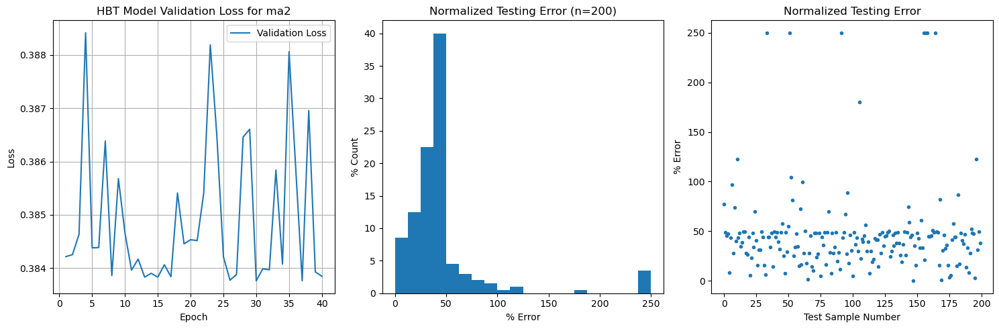

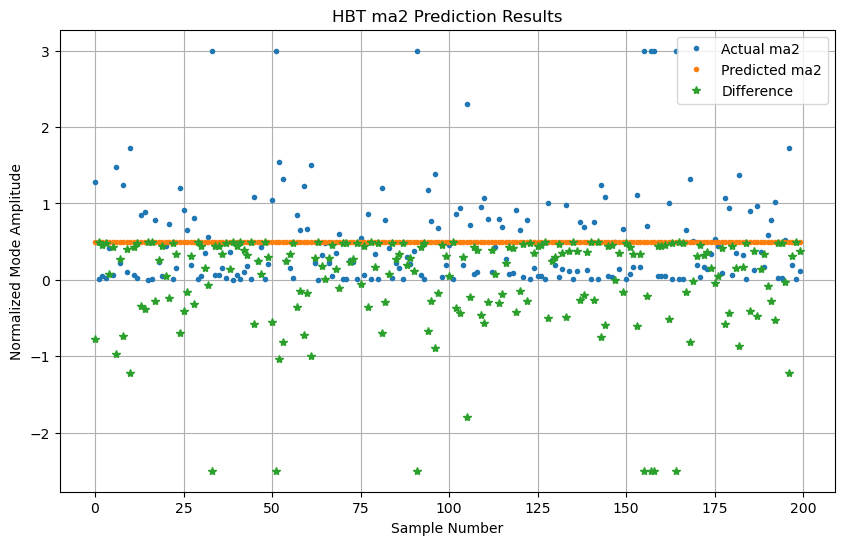

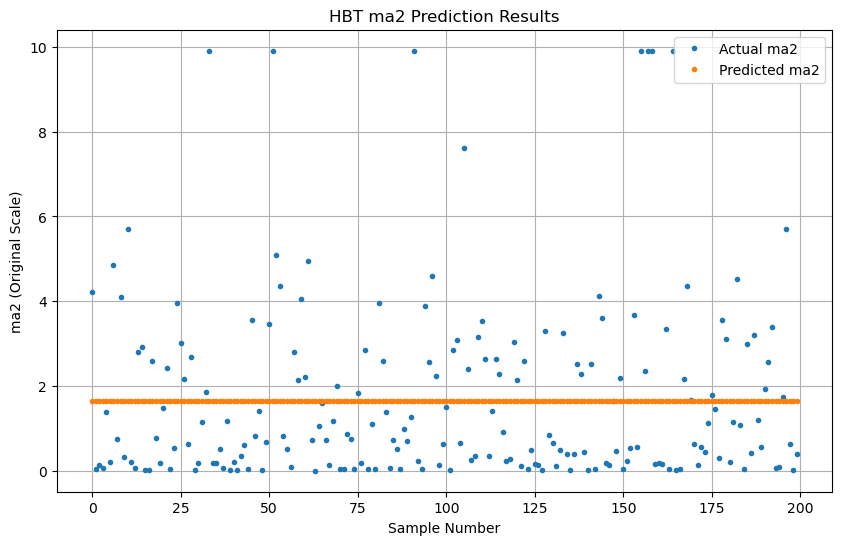

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 0.50
Mean absolute percentage error: 47.15%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

3.3025413894653317
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


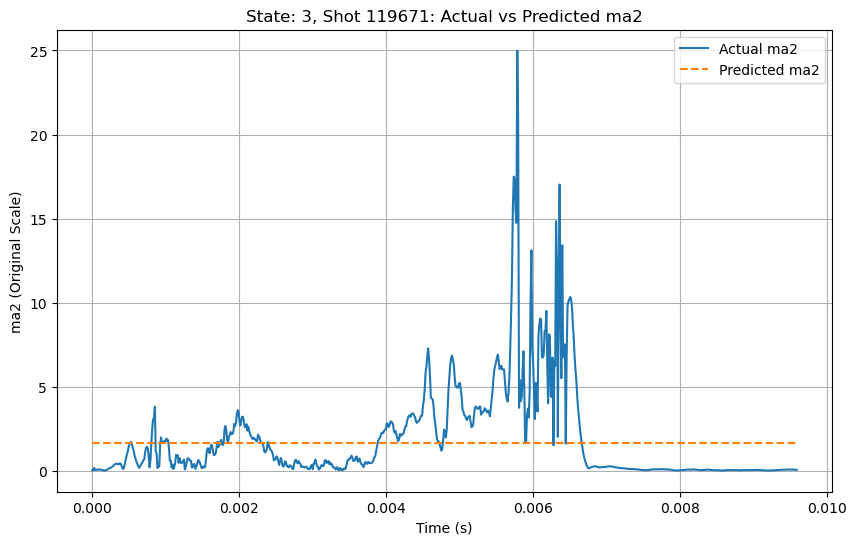

Shot 119671 - Mean absolute percentage error: 57.30%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 1.65


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
